In [700]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# data imports

* Residential Energy Consumption Survey (RECS) - Residential Energy Consumption Survey (RECS)
* Starting from the survey on US household consumption(https://www.eia.gov/consumption/residential/data/2020/index.php?view=microdata&utm_source=chatgpt.com), electricity and gas consumption will be analysed for different categories, with the aim of classifying consumers into clusters based on this two main energy sources

In [701]:
np.random.seed(42)

In [702]:
energy_complete = pd.read_csv('recs2020.csv')

In [703]:
energy_complete

,DOEID,REGIONC,DIVISION,STATE_FIPS,state_postal,state_name,BA_climate,IECC_climate_code,UATYP10,HDD65,...,EVCHRGHOME,EVCHRGAPT,EVCHRGWKS,EVCHRGBUS,EVCHRGMUNI,EVCHRGDLR,EVCHRGHWY,EVCHRGOTH,EVHOMEAMT,EVCHRGTYPE
0,100001,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3844,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
1,100002,SOUTH,West South Central,5,AR,Arkansas,Mixed-Humid,4A,U,3766,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
2,100003,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3819,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
3,100004,SOUTH,South Atlantic,45,SC,South Carolina,Mixed-Humid,3A,U,2614,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
4,100005,NORTHEAST,Middle Atlantic,34,NJ,New Jersey,Mixed-Humid,4A,U,4219,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18491,118492,SOUTH,South Atlantic,24,MD,Maryland,Mixed-Humid,4A,U,4572,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18492,118493,NORTHEAST,New England,23,ME,Maine,Very-Cold,7A,R,9861,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18493,118494,SOUTH,West South Central,48,TX,Texas,Hot-Humid,2A,U,405,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18494,118495,SOUTH,South Atlantic,45,SC,South Carolina,Hot-Humid,3A,U,1245,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0


In [704]:
energy_complete.columns

Index(['DOEID', 'REGIONC', 'DIVISION', 'STATE_FIPS', 'state_postal',
       'state_name', 'BA_climate', 'IECC_climate_code', 'UATYP10', 'HDD65',
       ...
       'EVCHRGHOME', 'EVCHRGAPT', 'EVCHRGWKS', 'EVCHRGBUS', 'EVCHRGMUNI',
       'EVCHRGDLR', 'EVCHRGHWY', 'EVCHRGOTH', 'EVHOMEAMT', 'EVCHRGTYPE'],
      dtype='object', length=799)

In [705]:
energy_complete.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18496 entries, 0 to 18495
Columns: 799 entries, DOEID to EVCHRGTYPE
dtypes: float64(243), int64(549), object(7)
memory usage: 112.7+ MB


## selecting the features

* 1 Mobile home
* 2 Single-family house detached from any other house 
* 3 Single-family house attached to one or more other houses (for example: duplex, row house, or townhome)
* 4 Apartment in a building with 2 to 4 units
* 5 Apartment in a building with 5 or more units

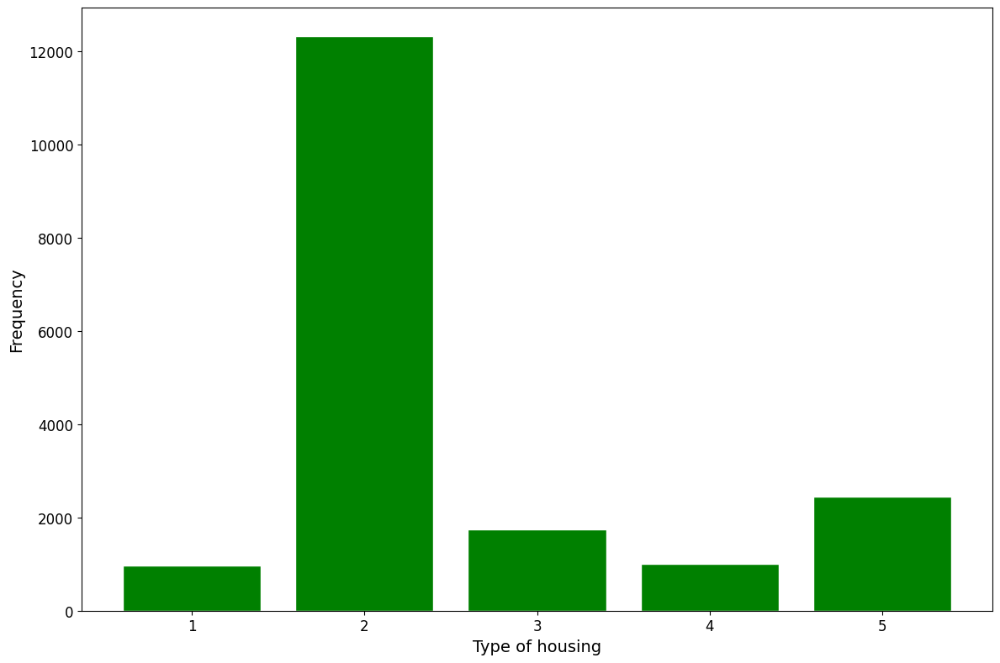

In [706]:
counts = energy_complete['TYPEHUQ'].value_counts().sort_index()

plt.figure(figsize=(12, 8))
plt.bar(counts.index.astype(str), counts.values, color='green', edgecolor='white')

plt.xlabel('Type of housing', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

In [707]:
energy_complete = energy_complete[energy_complete['TYPEHUQ'] == 2.0]

In [708]:
energy_complete

,DOEID,REGIONC,DIVISION,STATE_FIPS,state_postal,state_name,BA_climate,IECC_climate_code,UATYP10,HDD65,...,EVCHRGHOME,EVCHRGAPT,EVCHRGWKS,EVCHRGBUS,EVCHRGMUNI,EVCHRGDLR,EVCHRGHWY,EVCHRGOTH,EVHOMEAMT,EVCHRGTYPE
0,100001,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3844,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
3,100004,SOUTH,South Atlantic,45,SC,South Carolina,Mixed-Humid,3A,U,2614,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
5,100006,SOUTH,West South Central,48,TX,Texas,Hot-Humid,2A,U,901,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
6,100007,SOUTH,West South Central,40,OK,Oklahoma,Mixed-Humid,3A,U,3148,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
10,100011,WEST,Pacific,6,CA,California,Hot-Dry,3B,U,1467,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18488,118489,SOUTH,South Atlantic,12,FL,Florida,Hot-Humid,2A,R,184,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18489,118490,SOUTH,South Atlantic,51,VA,Virginia,Mixed-Humid,4A,R,4856,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18492,118493,NORTHEAST,New England,23,ME,Maine,Very-Cold,7A,R,9861,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18494,118495,SOUTH,South Atlantic,45,SC,South Carolina,Hot-Humid,3A,U,1245,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0


* 0 Not imputed
* 1 Imputed amount and cost
* 2 Imputed only amount for SOLAR=1 cases

In [709]:
energy_complete['ZELAMOUNT'].value_counts() # electricty

ZELAMOUNT
0    11054
1      893
2      372
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no natural gas use

In [710]:
energy_complete['ZNGAMOUNT'].value_counts() # gas

ZNGAMOUNT
 0    7012
-2    4565
 1     742
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no propane use

In [711]:
energy_complete['ZLPAMOUNT'].value_counts() # propane

ZLPAMOUNT
-2    10703
 1      843
 0      773
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no fuel oil/kerosene use

In [712]:
energy_complete['ZFOAMOUNT'].value_counts() # oil/kerosene

ZFOAMOUNT
-2    11339
 0      561
 1      419
Name: count, dtype: int64

In [713]:
cols_to_keep = [ 
                # Electricity usage measured in kilowatt-hours
                'KWHSPH', # Calibrated electricity usage for space heating, main and secondary, in kilowatt-hours, 2020
                'KWHCOL', # Calibrated electricity usage for space cooling (central air conditioning, individual units, and evaporative coolers), in kilowatthours, 2020
                'KWHAHUHEAT', # Calibrated electricity usage for distributing space heating via furnace fans and boiler pumps, in kilowatt-hours, 2020
                'KWHAHUCOL', # Calibrated electricity usage for furnace fans used for cooling, in kilowatt-hours, 2020
                'KWHWTH', # Calibrated electricity usage for water heating, main and secondary, in kilowatthours, 2020 
                'KWHRFG', # Calibrated electricity usage for all refrigerators, in kilowatthours, 2020
                'KWHFRZ', # Calibrated electricity usage for freezers, in kilowatt-hours, 2020
                'KWHCOK', # Calibrated electricity usage for cooking (cooktops, ovens, and ranges), in kilowatt-hours, 2020
                'KWHMICRO', # Calibrated electricity usage for microwaves, in kilowatt-hours, 2020
                'KWHCW', # Calibrated electricity usage for clothes washers, in kilowatt-hours, 2020
                'KWHCDR', # Calibrated electricity usage for clothes dryers, in kilowatt-hours, 2020
                'KWHDWH', # Calibrated electricity usage for dishwashers, in kilowatt-hours, 2020
                'KWHTVREL', # Calibrated electricity usage for televisions and related peripherals, in kilowatt-hours, 2020

                
                # Gas usage measured in thousand BTU
                'BTUNGSPH', # Calibrated natural gas usage for space heating, main and secondary, in thousand Btu, 2020
                'BTUNGWTH', # Calibrated natural gas usage for water heating, main and secondary, in thousand Btu, 2020
                'BTUNGCOK', # Calibrated natural gas usage for cooking (cooktops, ovens, and ranges), in thousand Btu, 2020
                'BTUNGOTH', # Calibrated natural gas usage for end uses other than space heating and water heating, in thousand Btu, 2020
                

                'TOTSQFT_EN' # Total energy-consuming area (square footage) of the housing unit. Includes all main living areas; all basements; heated, cooled, or finished attics; and heating or cooled garages
]

In [714]:
energy = energy_complete[cols_to_keep].copy()

In [715]:
energy['Tot_heating_elec'] = energy['KWHSPH'] + energy['KWHAHUHEAT']

In [716]:
energy['Tot_cooling_elec'] = energy['KWHCOL'] + energy['KWHAHUCOL']

In [717]:
energy['Tot_refrigeretor_elec'] = energy['KWHRFG'] + energy['KWHFRZ']

In [718]:
energy['Tot_cooking_elec'] = energy['KWHCOK'] + energy['KWHMICRO']

In [719]:
energy['Tot_appliances_elec'] = energy['KWHCW'] + energy['KWHCDR'] + energy['KWHDWH'] + energy['KWHTVREL']

In [720]:
energy.rename(columns={'KWHWTH':'Tot_waterheat_elec', 'BTUNGSPH':'Tot_heating_gas',
                       'BTUNGWTH':'Tot_waterheat_gas','BTUNGCOK':'Tot_cooking_gas',
                       'BTUNGOTH':'Tot_appliances_gas'},inplace=True)

In [721]:
gas_cols = ['Tot_heating_gas', 'Tot_waterheat_gas', 'Tot_cooking_gas', 'Tot_appliances_gas']

# conversion from kBtu to kWh
for col in gas_cols:
    energy[col] = energy[col] * 0.29307107

In [722]:
energy.drop([
            'KWHSPH', # Calibrated electricity usage for space heating, main and secondary, in kilowatt-hours, 2020
            'KWHCOL', # Calibrated electricity usage for space cooling (central air conditioning, individual units, and evaporative coolers), in kilowatthours, 2020
            'KWHAHUHEAT', # Calibrated electricity usage for distributing space heating via furnace fans and boiler pumps, in kilowatt-hours, 2020
            'KWHAHUCOL', # Calibrated electricity usage for furnace fans used for cooling, in kilowatt-hours, 2020
            'KWHRFG', # Calibrated electricity usage for all refrigerators, in kilowatthours, 2020
            'KWHFRZ', # Calibrated electricity usage for freezers, in kilowatt-hours, 2020
            'KWHCOK', # Calibrated electricity usage for cooking (cooktops, ovens, and ranges), in kilowatt-hours, 2020
            'KWHMICRO', # Calibrated electricity usage for microwaves, in kilowatt-hours, 2020
            'KWHCW', # Calibrated electricity usage for clothes washers, in kilowatt-hours, 2020
            'KWHCDR', # Calibrated electricity usage for clothes dryers, in kilowatt-hours, 2020
            'KWHDWH', # Calibrated electricity usage for dishwashers, in kilowatt-hours, 2020
            'KWHTVREL', # Calibrated electricity usage for televisions and related peripherals, in kilowatt-hours, 2020
],axis=1,inplace=True)

In [723]:
energy

,Tot_waterheat_elec,Tot_heating_gas,Tot_waterheat_gas,Tot_cooking_gas,Tot_appliances_gas,TOTSQFT_EN,Tot_heating_elec,Tot_cooling_elec,Tot_refrigeretor_elec,Tot_cooking_elec,Tot_appliances_elec
0,0.00,21670.313811,6225.222242,1975.559845,1975.559845,2100,309.06,3920.66,1767.81,374.14,3847.64
3,0.00,9552.812716,6172.431350,428.434736,428.434736,2100,3308.71,1760.83,965.40,473.72,1718.97
5,0.00,4267.522148,5717.294909,0.000000,692.597275,4520,89.56,8272.06,1374.54,1315.51,632.31
6,0.00,20104.854175,4064.154271,0.000000,0.000000,2100,3751.47,5675.82,707.12,540.04,1902.81
10,0.00,6511.672837,2997.809321,0.000000,0.000000,1630,161.44,2767.98,1310.01,129.82,641.97
...,...,...,...,...,...,...,...,...,...,...,...
18488,1761.98,0.000000,0.000000,0.000000,0.000000,2490,0.00,4602.96,1887.11,449.72,1643.96
18489,261.84,0.000000,0.000000,0.000000,0.000000,1850,573.89,121.95,120.09,72.50,228.00
18492,0.00,0.000000,0.000000,0.000000,0.000000,3070,1468.09,938.13,610.62,254.21,527.51
18494,1603.47,0.000000,0.000000,0.000000,0.000000,3000,1469.98,6742.96,2140.54,196.55,511.59


<Axes: >

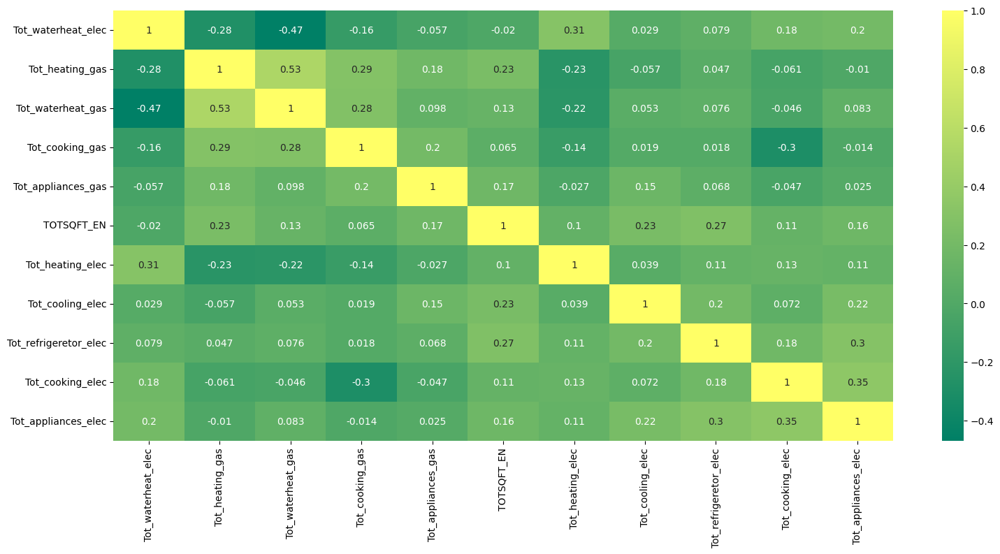

In [724]:
plt.figure(figsize=(18,8))
sns.heatmap(energy.corr(),cmap='summer',annot=True)

In [725]:
for col in energy.columns:
    if col != 'TOTSQFT_EN':
        energy[col + '_EUI'] = energy[col] / energy['TOTSQFT_EN']

In [726]:
energy.drop('TOTSQFT_EN',axis=1,inplace=True)

In [727]:
for col in energy.columns:
    if 'EUI' not in col:
        energy.drop(col,axis=1,inplace=True)

In [728]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
0,0.000000,10.319197,2.964392,0.940743,0.940743,0.147171,1.866981,0.841814,0.178162,1.832210
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
...,...,...,...,...,...,...,...,...,...,...
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827
18494,0.534490,0.000000,0.000000,0.000000,0.000000,0.489993,2.247653,0.713513,0.065517,0.170530


<Axes: >

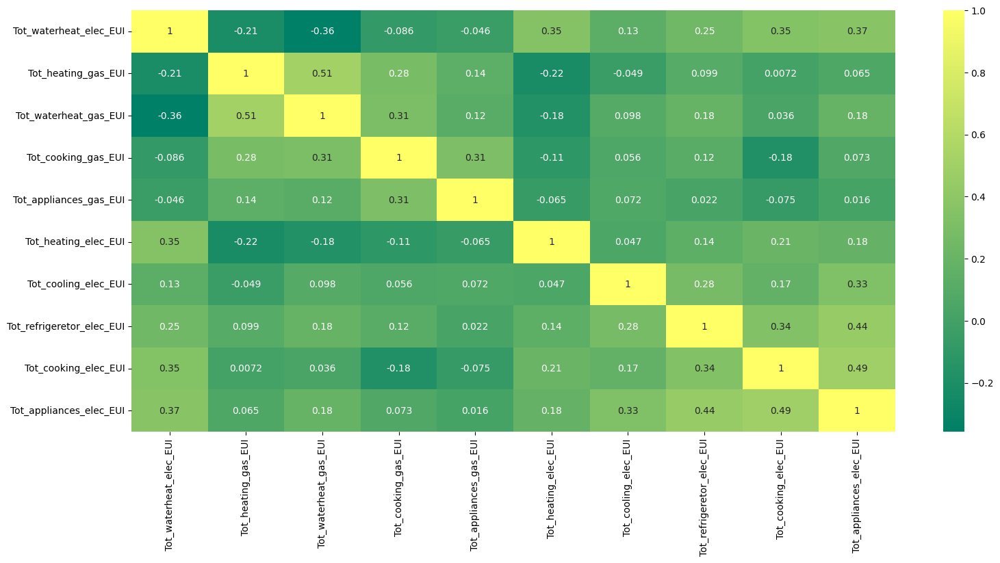

In [729]:
plt.figure(figsize=(18,8))
sns.heatmap(energy.corr(),cmap='summer',annot=True)

## missing values and duplicates

In [730]:
energy.isna().sum()

Tot_waterheat_elec_EUI       0
Tot_heating_gas_EUI          0
Tot_waterheat_gas_EUI        0
Tot_cooking_gas_EUI          0
Tot_appliances_gas_EUI       0
Tot_heating_elec_EUI         0
Tot_cooling_elec_EUI         0
Tot_refrigeretor_elec_EUI    0
Tot_cooking_elec_EUI         0
Tot_appliances_elec_EUI      0
dtype: int64

In [731]:
energy.duplicated().sum()

0

## outlier removal

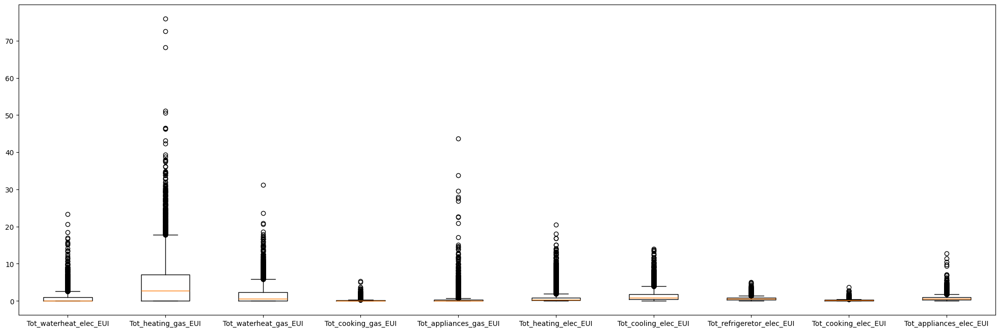

In [732]:
plt.figure(figsize=(25,8))
plt.boxplot(energy,tick_labels=energy.columns)
plt.show()

In [733]:
Q1 = energy.quantile(0.25)
Q3 = energy.quantile(0.75)
IQR = Q3 - Q1

energy = energy[~((energy < (Q1 - 1.5 * IQR)) | (energy > (Q3 + 1.5 * IQR))).any(axis=1)]

In [734]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
11,0.000000,5.905428,1.669820,0.211160,0.211160,0.000000,2.009019,0.617831,0.059091,1.254344
...,...,...,...,...,...,...,...,...,...,...
18487,1.406165,0.000000,0.000000,0.000000,0.000000,0.084565,1.519541,0.865071,0.124429,1.248035
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827


## data standardization

In [735]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
11,0.000000,5.905428,1.669820,0.211160,0.211160,0.000000,2.009019,0.617831,0.059091,1.254344
...,...,...,...,...,...,...,...,...,...,...
18487,1.406165,0.000000,0.000000,0.000000,0.000000,0.084565,1.519541,0.865071,0.124429,1.248035
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827


In [736]:
scaler = StandardScaler()

In [737]:
energy_scaled = scaler.fit_transform(energy)

In [738]:
np.mean(energy_scaled),np.std(energy_scaled)

(-2.066404952771019e-17, 1.0)

In [739]:
energy_scaled = pd.DataFrame(energy_scaled,columns=energy.columns)

In [740]:
energy_scaled

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921
...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488


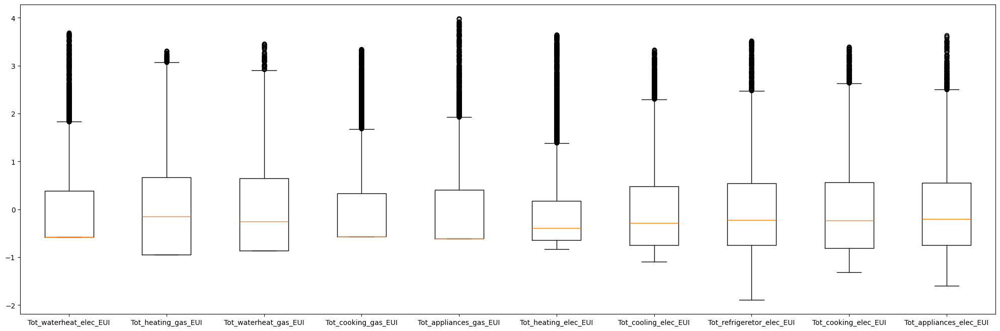

In [741]:
plt.figure(figsize=(25,8))
plt.boxplot(energy_scaled,tick_labels=energy_scaled.columns)
plt.show()

# dimensionality reduction algorithms

## pca 

In [742]:
pca_general = PCA()

In [743]:
pca_general.fit(energy_scaled)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [744]:
explained_variance = pca_general.explained_variance_ratio_

In [745]:
explained_variance

array([0.28032367, 0.18895147, 0.12704675, 0.08532331, 0.08169869,
       0.0685402 , 0.05957754, 0.05518687, 0.03189739, 0.02145411])

In [746]:
eigenvalues = pca_general.explained_variance_

In [747]:
eigenvalues

array([2.80363199, 1.88978112, 1.27064668, 0.85335345, 0.81710212,
       0.68549867, 0.59585945, 0.55194648, 0.31901889, 0.21457139])

In [748]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[2.8036319885511203, 1.889781124146604, 1.270646681554841]


In [749]:
N_COMPONENTS = len(selected_components)

In [750]:
eigenvectors = pca_general.components_

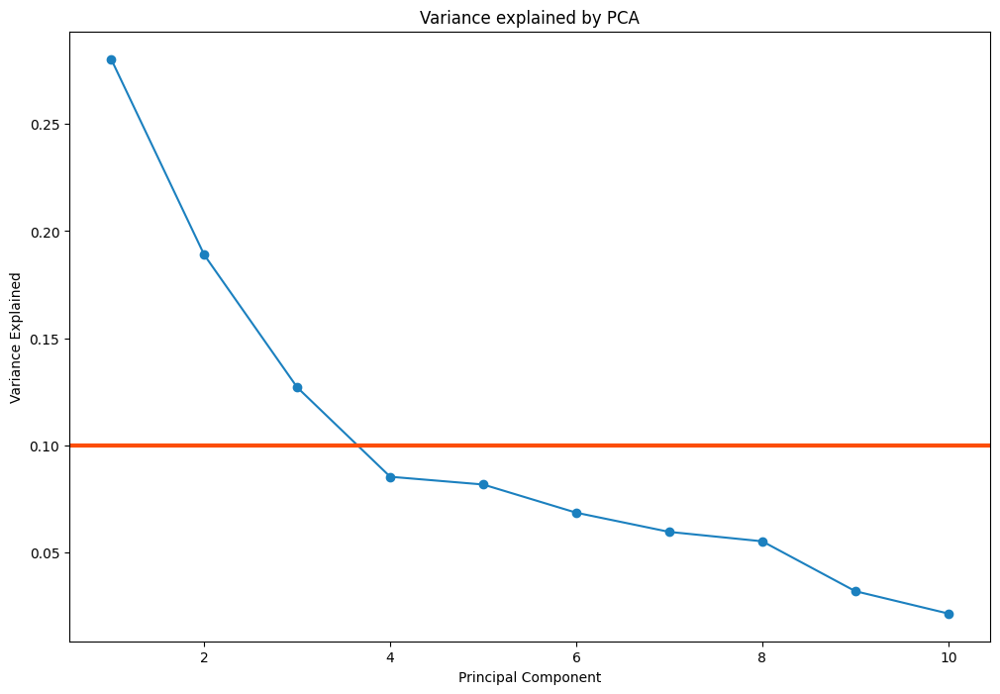

In [751]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [752]:
pca = PCA(n_components=N_COMPONENTS)

In [753]:
X_pca = pca.fit_transform(energy_scaled)

In [754]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [755]:
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

In [756]:
X_pca

,dim_1,dim_2,dim_3
0,0.886679,1.363975,1.186636
1,-0.110236,-0.167015,-0.663318
2,-0.966315,2.136664,0.196361
3,0.073670,0.551620,-0.449555
4,1.649792,1.775372,1.256657
...,...,...,...
7087,-2.202718,1.358424,1.035535
7088,-1.573662,0.599975,0.321832
7089,-0.416653,-2.763515,-0.690737
7090,-0.618345,-2.158439,-0.582987


## t-SNE

In [757]:
tsne = TSNE(n_components=3,random_state=42)

In [ ]:
X_tsne = tsne.fit_transform(energy_scaled)

In [ ]:
tsne_columns = [f'dim_{i+1}' for i in range(3)]

In [ ]:
X_tsne = pd.DataFrame(X_tsne, columns=tsne_columns)

In [ ]:
X_tsne

,dim_1,dim_2,dim_3
0,2.536473,-0.569887,9.241193
1,-4.466090,7.754672,-10.270030
2,-11.023314,11.286777,-2.401266
3,2.220190,8.093020,-1.315360
4,11.463785,9.571602,4.114413
...,...,...,...
7087,-9.545277,-2.896458,16.773628
7088,-8.877161,-0.713788,7.598481
7089,-6.021173,-15.945735,-2.919369
7090,-5.589542,-12.948777,-2.492481


## umap

In [ ]:
umap = umap.UMAP(n_components=3,random_state=42)

In [ ]:
X_umap = umap.fit_transform(energy_scaled)

In [ ]:
umap_columns = [f'dim_{i+1}' for i in range(3)]

In [ ]:
X_umap = pd.DataFrame(X_umap, columns=umap_columns)

In [ ]:
X_umap

,dim_1,dim_2,dim_3
0,8.540884,5.635366,8.092696
1,6.674550,7.703112,4.661761
2,8.055438,8.882436,5.173176
3,7.841428,6.987625,5.274173
4,9.224665,5.318230,7.319454
...,...,...,...
7087,0.898640,4.104914,6.800636
7088,0.870373,5.136365,5.973392
7089,-0.109102,8.384296,7.264081
7090,-0.318984,7.911990,6.649530


# clustering algorithms

## k-means 

In [ ]:
N_CLUSTER = 3

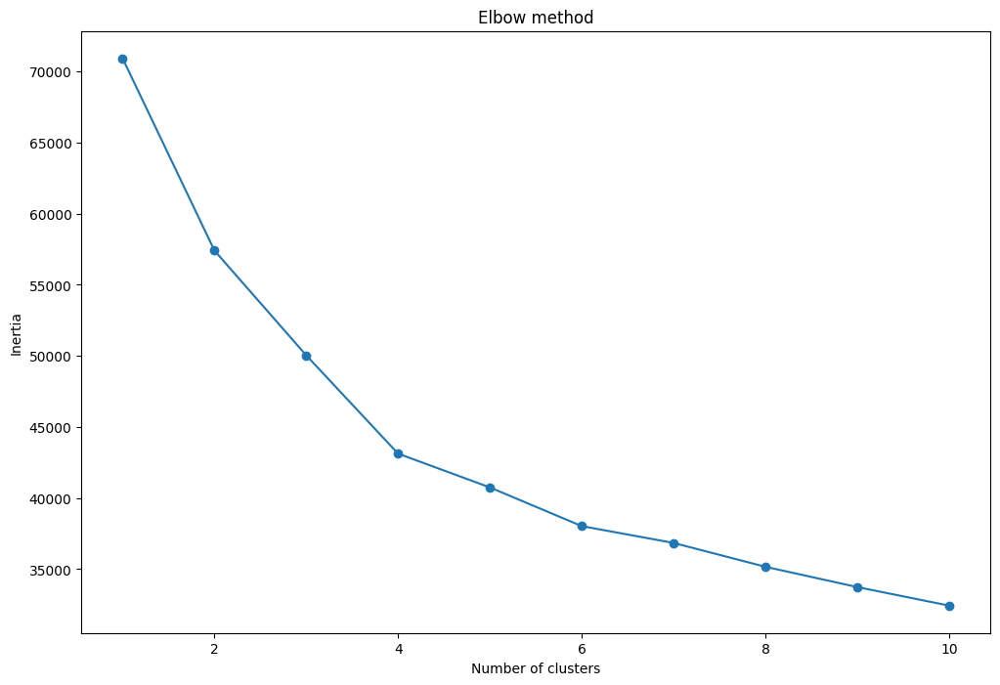

In [ ]:
data = energy_scaled
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans.fit(energy_scaled)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_kmeans = energy_scaled.copy()

In [ ]:
df_kmeans['k_means'] = kmeans.labels_

In [ ]:
df_kmeans

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,k_means
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,4
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,2
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,0
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,3
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,1
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,1
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,4
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,4


In [ ]:
df_kmeans['k_means'].unique()

array([3, 4, 2, 0, 1])

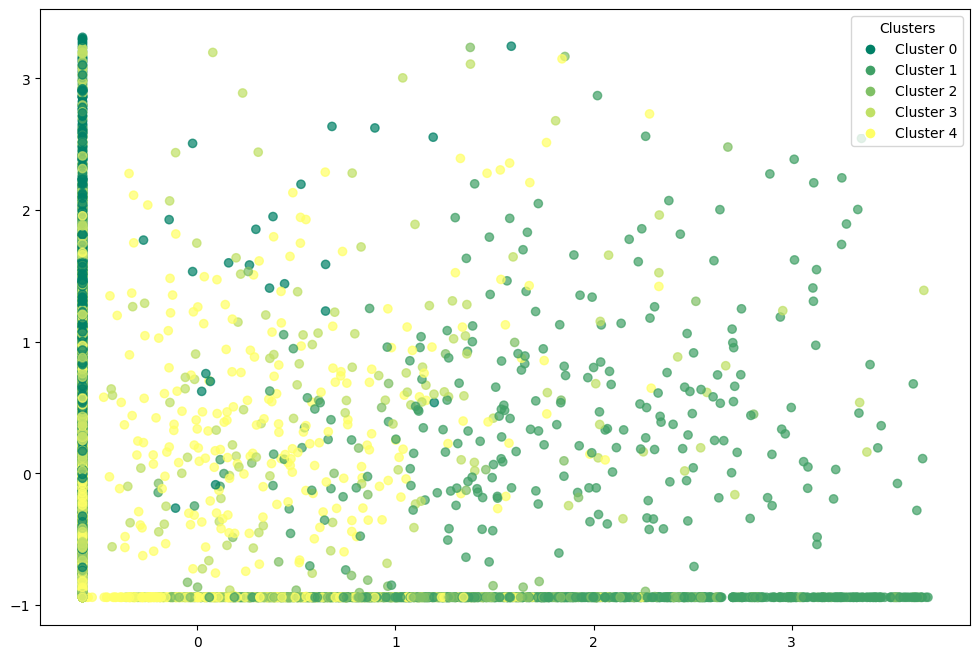

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
df_kmeans.groupby(df_kmeans['k_means']).mean() 

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
k_means,,,,,,,,,,
0,-0.564620,0.811372,1.054089,-0.395653,-0.305073,-0.232691,0.298259,0.433737,0.705435,0.596877
1,1.458811,-0.626227,-0.863775,-0.489266,-0.502159,-0.143138,0.257364,0.626583,0.658938,0.650687
2,0.795109,-0.816792,-0.756124,-0.514326,-0.521765,2.347937,0.401673,0.040673,0.184668,0.124984
3,-0.461503,0.557676,0.645907,1.611281,1.523777,-0.299266,-0.000213,-0.082492,-0.692263,-0.253655
4,-0.274030,-0.341408,-0.465426,-0.424820,-0.416579,-0.338112,-0.447001,-0.539375,-0.368971,-0.569574


In [ ]:
sil = silhouette_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])
ch = calinski_harabasz_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])
db = davies_bouldin_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.1887527990095465
Calinski-Harabasz: 1357.102330471762
Davies-Bouldin: 1.65046652936353


### k-means with pca

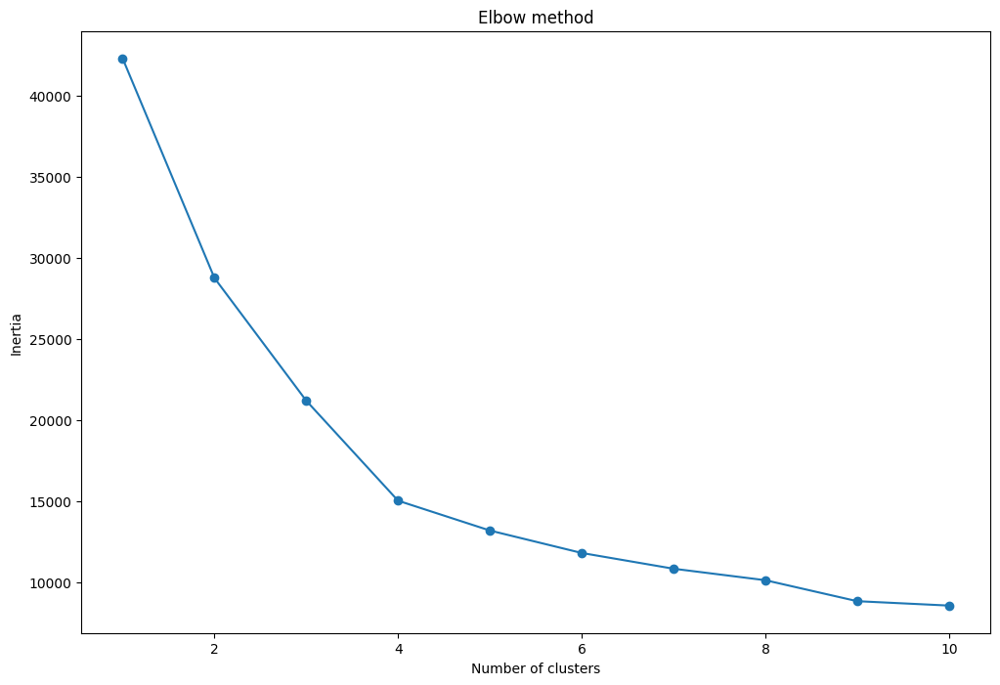

In [ ]:
data = X_pca
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [ ]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_pca.fit(X_pca)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_pca_kmeans = X_pca.copy()

In [ ]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [ ]:
df_pca_kmeans

,dim_1,dim_2,dim_3,kmeans_pca
0,0.886679,1.363975,1.186636,3
1,-0.110236,-0.167015,-0.663318,0
2,-0.966315,2.136664,0.196361,4
3,0.073670,0.551620,-0.449555,0
4,1.649792,1.775372,1.256657,3
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,1
7090,-0.618345,-2.158439,-0.582987,1


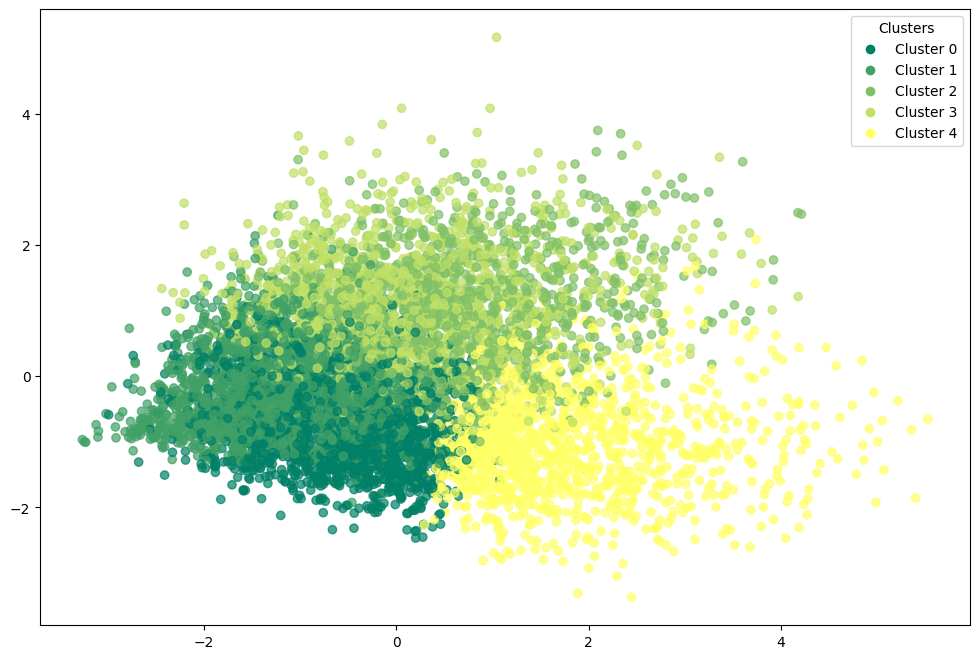

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 1], df_pca_kmeans.iloc[:, 2], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
df_pca_kmeans.groupby(df_pca_kmeans['kmeans_pca']).mean() 

,dim_1,dim_2,dim_3
kmeans_pca,,,
0,0.725906,-0.593428,-0.745747
1,-0.981023,-1.208621,-0.191368
2,-2.209511,0.661024,1.055660
3,2.443630,0.143679,1.123317
4,0.085782,1.829495,-1.027769


In [ ]:
energy_scaled['kmeans_pca'] = df_pca_kmeans['kmeans_pca']

In [ ]:
energy_scaled.groupby(energy_scaled['kmeans_pca']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_pca,,,,,,,,,,
0,-0.529231,0.458737,0.280222,-0.133568,-0.056576,-0.373098,-0.351280,-0.510635,-0.349947,-0.547577
1,0.179816,-0.765407,-0.836349,-0.533341,-0.559306,0.017910,-0.444534,-0.410988,-0.228052,-0.439513
2,1.448150,-0.747321,-0.840468,-0.502989,-0.520293,0.960815,0.651320,0.661159,0.600255,0.700618
3,-0.440081,0.569198,0.701794,1.742216,1.647881,-0.263700,0.110512,0.008511,-0.691192,-0.182710
4,-0.542457,0.721395,1.000738,-0.425137,-0.360603,-0.205184,0.379200,0.629030,0.970146,0.891576


In [ ]:
energy_scaled.drop('kmeans_pca',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])
ch = calinski_harabasz_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])
db = davies_bouldin_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.30756652592290457
Calinski-Harabasz: 3975.129527500658
Davies-Bouldin: 1.0248526750462106


### k-means with t-SNE

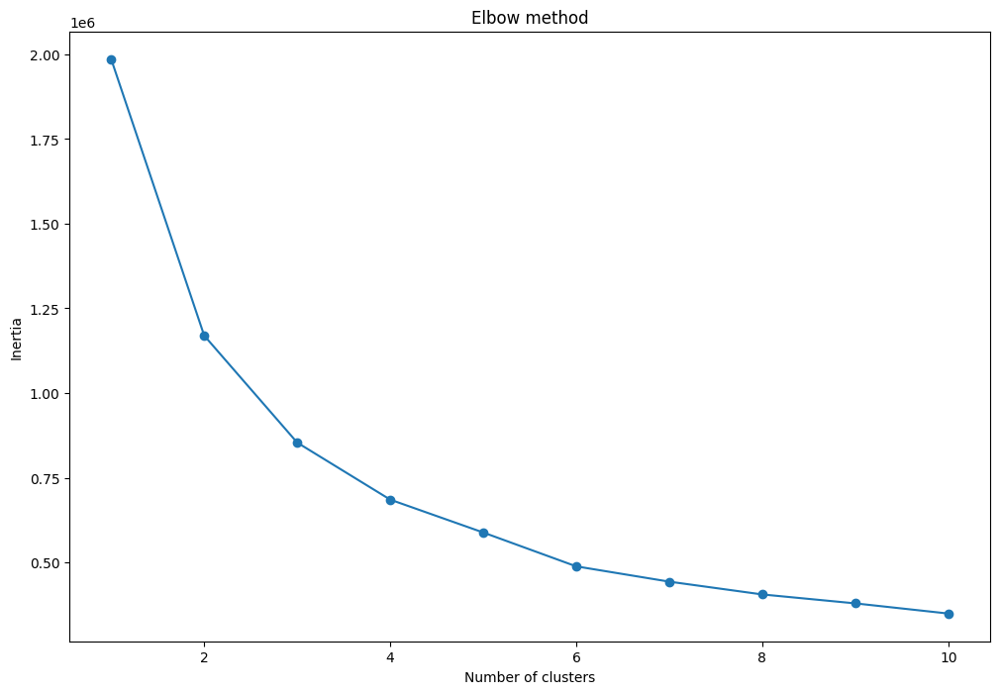

In [ ]:
data = X_tsne
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [ ]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_tsne.fit(X_tsne)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_tsne_kmeans = X_tsne.copy()

In [ ]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [ ]:
df_tsne_kmeans

,dim_1,dim_2,dim_3,kmeans_tsne
0,2.536473,-0.569887,9.241193,2
1,-4.466090,7.754672,-10.270030,4
2,-11.023314,11.286777,-2.401266,4
3,2.220190,8.093020,-1.315360,4
4,11.463785,9.571602,4.114413,2
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,1
7088,-8.877161,-0.713788,7.598481,1
7089,-6.021173,-15.945735,-2.919369,3
7090,-5.589542,-12.948777,-2.492481,3


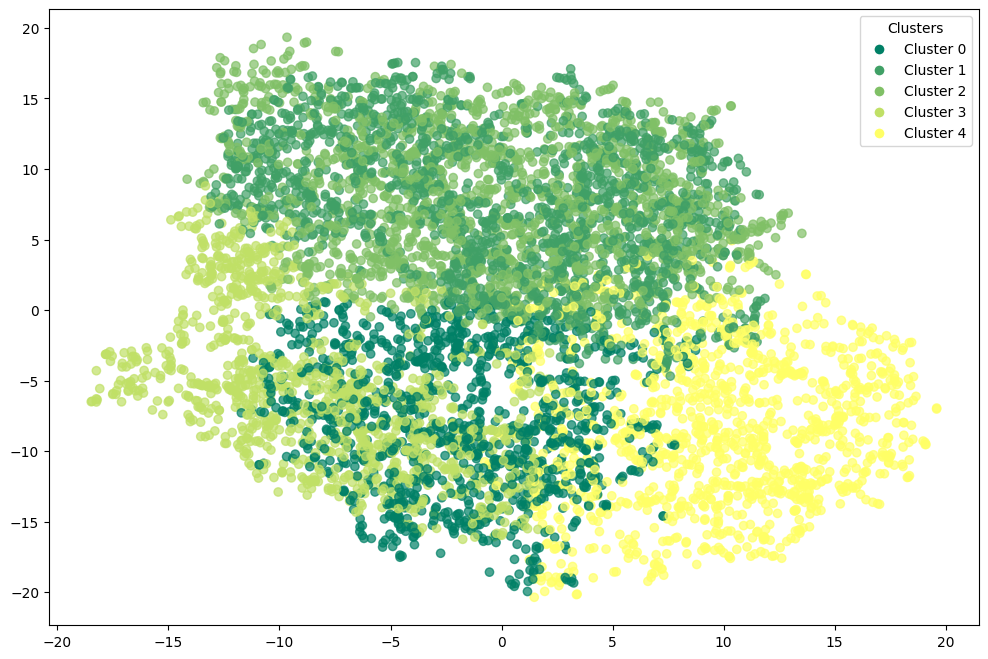

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 1], df_tsne_kmeans.iloc[:, 2], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
df_tsne_kmeans.groupby(df_tsne_kmeans['kmeans_tsne']).mean()

,dim_1,dim_2,dim_3
kmeans_tsne,,,
0,10.091497,-1.782870,-7.884547
1,-13.310840,0.006462,7.273739
2,11.835523,-0.447303,7.777032
3,-10.409621,-7.833417,-5.514715
4,2.302297,9.772107,-8.336171


In [ ]:
energy_scaled['kmeans_tsne'] = df_tsne_kmeans['kmeans_tsne']

In [ ]:
energy_scaled.groupby(energy_scaled['kmeans_tsne']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_tsne,,,,,,,,,,
0,-0.567068,0.609361,0.473510,-0.216086,0.022939,-0.374797,-0.384293,-0.412764,-0.269270,-0.545797
1,1.268999,-0.713950,-0.835615,-0.548855,-0.576981,0.908546,0.285272,0.212834,0.306361,0.227671
2,-0.313129,0.478417,0.451685,1.477508,1.360389,-0.278719,0.061901,-0.104744,-0.637064,-0.162866
3,-0.284358,-0.869865,-0.850715,-0.548937,-0.582915,-0.377004,-0.558117,-0.226573,-0.075725,-0.246030
4,-0.571689,0.655721,0.971791,-0.490920,-0.479275,-0.193174,0.415718,0.445306,0.755685,0.645607


In [ ]:
energy_scaled.drop('kmeans_tsne',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])
ch = calinski_harabasz_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])
db = davies_bouldin_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3271937072277069
Calinski-Harabasz: 4211.234123957945
Davies-Bouldin: 1.1371650330027543


### k-means with umap

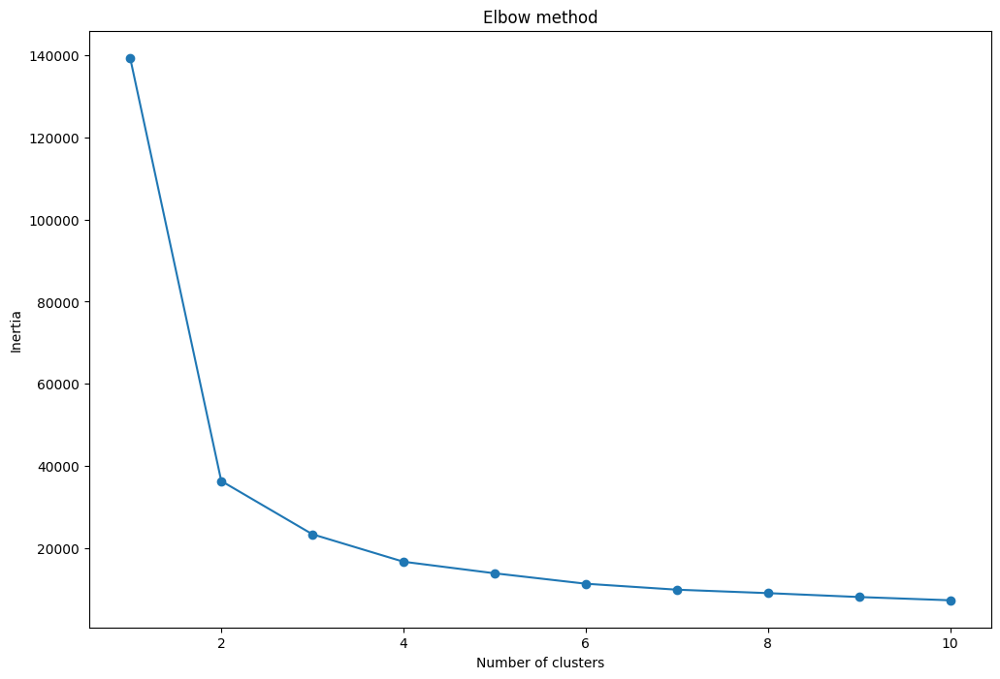

In [ ]:
data = X_umap
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [ ]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_umap.fit(X_umap)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_umap_kmeans = X_umap.copy()

In [ ]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [ ]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,3
2,8.055438,8.882436,5.173176,3
3,7.841428,6.987625,5.274173,3
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


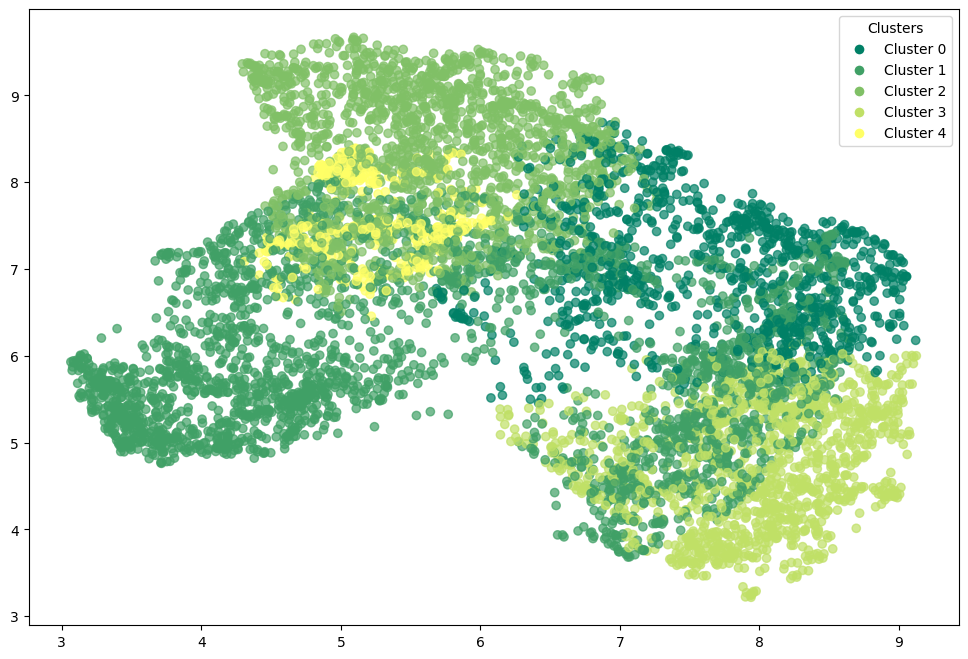

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 1], df_umap_kmeans.iloc[:, 2], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['kmeans_umap'] = df_umap_kmeans['kmeans_umap']

In [ ]:
energy_scaled.groupby(energy_scaled['kmeans_umap']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_umap,,,,,,,,,,
0,-0.554008,0.449877,0.282672,-0.338196,-0.039989,-0.311369,-0.261308,-0.580542,-0.327805,-0.650126
1,0.587513,-0.911429,-0.857359,-0.555326,-0.588714,0.406561,-0.041089,0.039283,0.150297,0.051325
2,-0.533749,0.504960,0.697847,1.497296,1.357481,-0.282734,0.041050,-0.038541,-0.634881,-0.171598
3,-0.571956,0.728340,0.988268,-0.531920,-0.518233,-0.154183,0.280250,0.449954,0.785995,0.624822
4,1.403727,0.709644,-0.856438,0.033747,0.051191,-0.327373,-0.103198,-0.040297,0.014168,0.066441


In [ ]:
energy_scaled.drop('kmeans_umap',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])
ch = calinski_harabasz_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])
db = davies_bouldin_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.4115878641605377
Calinski-Harabasz: 12050.719386284154
Davies-Bouldin: 0.8651610402282032


## Birch

In [ ]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch.fit(energy_scaled)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_birch = energy_scaled.copy()

In [ ]:
df_birch['birch'] = birch.labels_

In [ ]:
df_birch

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,birch
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,4
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,3
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,4
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,2
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,4
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,4
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,4


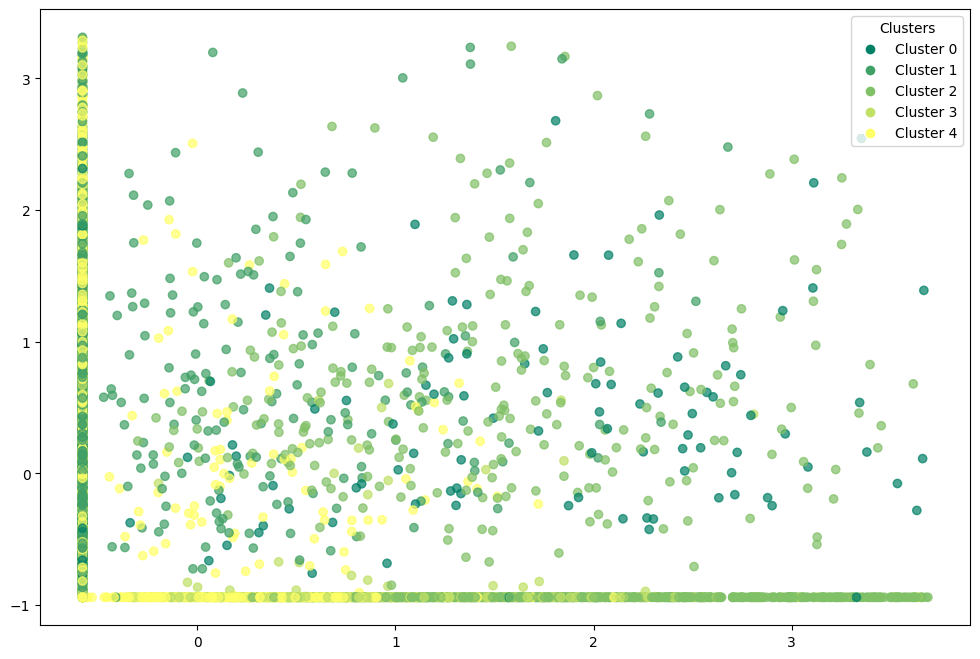

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
df_birch.groupby(df_birch['birch']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch,,,,,,,,,,
0,0.061061,0.138245,0.362921,1.470245,1.429224,-0.414608,1.159523,0.467301,-0.484342,0.320785
1,-0.498027,0.564424,0.477969,0.714905,0.780731,-0.334644,-0.347545,-0.354983,-0.514535,-0.487829
2,1.786267,-0.527472,-0.863674,-0.554007,-0.574665,0.182341,0.129960,0.467529,0.481127,0.479969
3,0.470915,-0.688981,-0.554051,-0.426131,-0.448261,2.228577,-0.004720,-0.243584,0.052123,-0.054094
4,-0.368522,-0.111796,0.014266,-0.469457,-0.503398,-0.281453,0.070974,0.108826,0.290672,0.184433


In [ ]:
sil = silhouette_score(df_birch.iloc[:,:-1], df_birch['birch'])
ch = calinski_harabasz_score(df_birch.iloc[:,:-1], df_birch['birch'])
db = davies_bouldin_score(df_birch.iloc[:,:-1], df_birch['birch'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.10109859975892824
Calinski-Harabasz: 743.6190908269416
Davies-Bouldin: 2.167269744350043


### Birch with pca

In [ ]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_pca_birch = X_pca.copy()

In [ ]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [ ]:
df_pca_birch

,dim_1,dim_2,dim_3,birch_pca
0,0.886679,1.363975,1.186636,2
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,3
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,2
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,0
7088,-1.573662,0.599975,0.321832,0
7089,-0.416653,-2.763515,-0.690737,0
7090,-0.618345,-2.158439,-0.582987,0


In [ ]:
energy_scaled['birch_pca'] = df_pca_birch['birch_pca']

In [ ]:
energy_scaled.groupby(energy_scaled['birch_pca']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_pca,,,,,,,,,,
0,0.637711,-0.780242,-0.842014,-0.544074,-0.572924,0.374316,-0.042567,0.003565,0.117672,0.009518
1,-0.541725,0.587260,0.523433,-0.411229,-0.329020,-0.314084,-0.218739,-0.232978,0.102405,-0.183352
2,-0.383405,0.477057,0.509069,1.383189,1.356458,-0.279978,0.057286,-0.114296,-0.665916,-0.277781
3,-0.520452,0.910301,1.295070,-0.512113,-0.454571,-0.172559,0.713197,1.111018,1.539243,1.549436
4,-0.550681,0.795187,1.525905,1.938914,1.622424,-0.070883,1.130199,1.277350,-0.210560,1.226587


In [ ]:
energy_scaled.drop('birch_pca',axis=1,inplace=True)

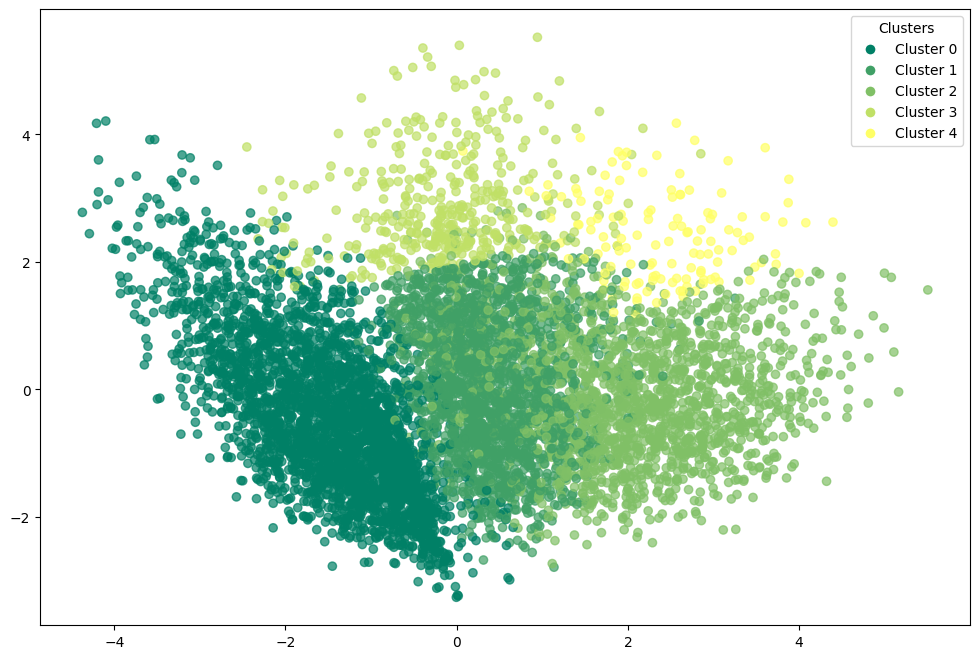

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_birch.iloc[:, 0], df_pca_birch.iloc[:, 1], 
                      c=df_pca_birch['birch_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_birch['birch_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
sil = silhouette_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])
ch = calinski_harabasz_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])
db = davies_bouldin_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.2536679404936043
Calinski-Harabasz: 2344.2780128169334
Davies-Bouldin: 1.0701387379625875


### Birch with t-SNE

In [ ]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_tsne_birch = X_tsne.copy()

In [ ]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [ ]:
df_tsne_birch

,dim_1,dim_2,dim_3,birch_tsne
0,2.536473,-0.569887,9.241193,4
1,-4.466090,7.754672,-10.270030,2
2,-11.023314,11.286777,-2.401266,3
3,2.220190,8.093020,-1.315360,2
4,11.463785,9.571602,4.114413,4
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,3
7088,-8.877161,-0.713788,7.598481,3
7089,-6.021173,-15.945735,-2.919369,0
7090,-5.589542,-12.948777,-2.492481,0


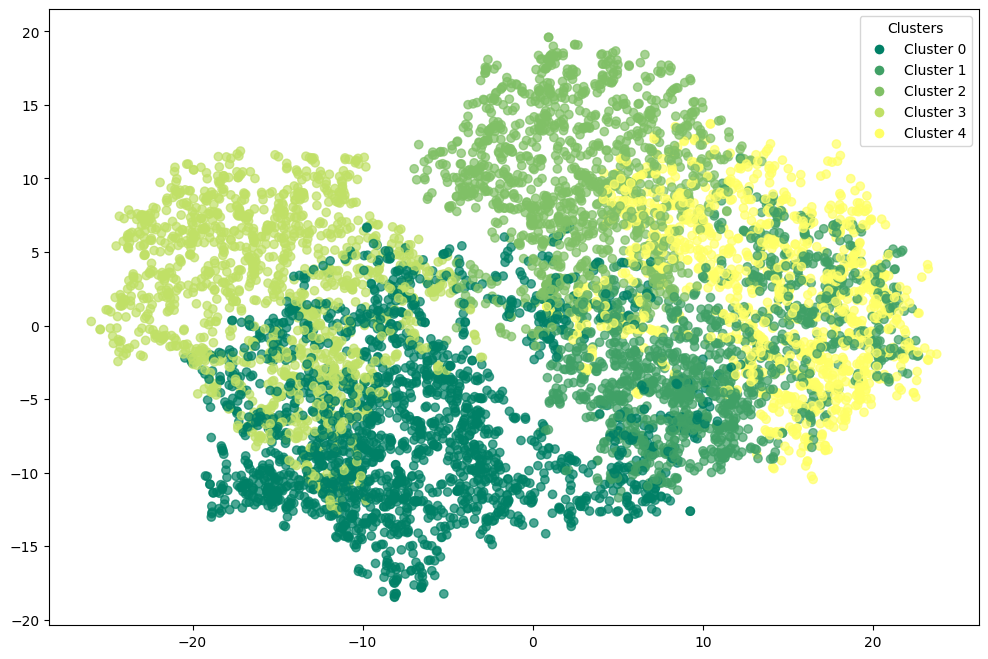

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['birch_tsne'] = df_tsne_birch['birch_tsne']

In [ ]:
energy_scaled.groupby('birch_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_tsne,,,,,,,,,,
0,0.171354,-0.488555,-0.758982,-0.380946,-0.336200,-0.331767,-0.205009,-0.224309,-0.117197,-0.193026
1,-0.566512,0.536900,0.429506,0.022044,0.229603,-0.391413,-0.406483,-0.405889,-0.401639,-0.589100
2,-0.569234,0.726028,0.996927,-0.530724,-0.515349,-0.181182,0.261149,0.477450,0.792003,0.619904
3,1.275943,-0.854403,-0.818380,-0.548842,-0.581645,1.272801,0.312720,0.306340,0.409695,0.342654
4,-0.542751,0.498646,0.783358,1.833408,1.540432,-0.236941,0.198506,0.016690,-0.622616,-0.020645


In [ ]:
energy_scaled.drop('birch_tsne',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])
ch = calinski_harabasz_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])
db = davies_bouldin_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.2712894678115845
Calinski-Harabasz: 3383.488514691763
Davies-Bouldin: 1.2485700120404553


### Birch with umap

In [ ]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_umap_birch = X_umap.copy()

In [ ]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [ ]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap
0,8.540884,5.635366,8.092696,3
1,6.674550,7.703112,4.661761,0
2,8.055438,8.882436,5.173176,0
3,7.841428,6.987625,5.274173,0
4,9.224665,5.318230,7.319454,3
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,4
7090,-0.318984,7.911990,6.649530,4


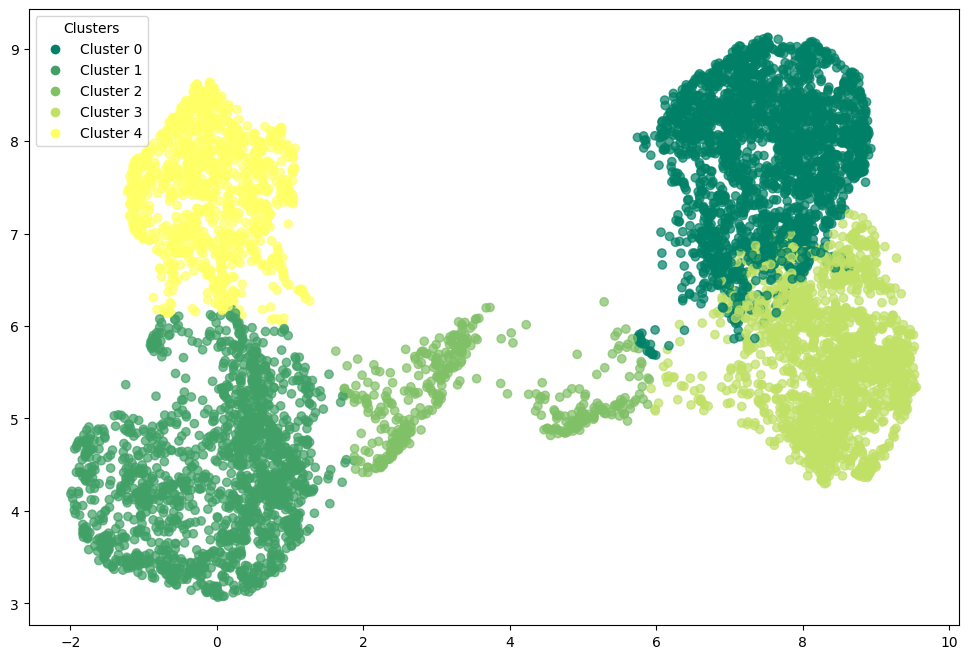

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['birch_umap'] = df_umap_birch['birch_umap']

In [ ]:
energy_scaled.groupby('birch_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_umap,,,,,,,,,,
0,-0.562718,0.596651,0.662073,-0.427637,-0.289454,-0.227503,0.032491,-0.022960,0.273541,0.040606
1,1.257384,-0.898716,-0.857391,-0.551000,-0.584620,0.963591,0.292002,0.210069,0.317372,0.224616
2,1.395089,0.710188,-0.856385,0.037394,0.060351,-0.325916,-0.109287,-0.066938,0.002898,0.056256
3,-0.535422,0.512016,0.713413,1.518844,1.375258,-0.280040,0.048403,-0.022817,-0.637393,-0.158673
4,-0.366541,-0.925194,-0.857339,-0.561561,-0.594411,-0.392956,-0.515853,-0.196999,-0.085908,-0.193333


In [ ]:
energy_scaled.drop('birch_umap',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])
ch = calinski_harabasz_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])
db = davies_bouldin_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.47263675928115845
Calinski-Harabasz: 14918.547896186505
Davies-Bouldin: 0.7775542692201887


## GMM - Gaussian Mixture Models

In [ ]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm.fit(energy_scaled)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_gmm = energy_scaled.copy()

In [ ]:
df_gmm['gmm'] = gmm.predict(energy_scaled)

In [ ]:
df_gmm

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,gmm
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,1
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,1
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,4
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,4
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,4
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,4


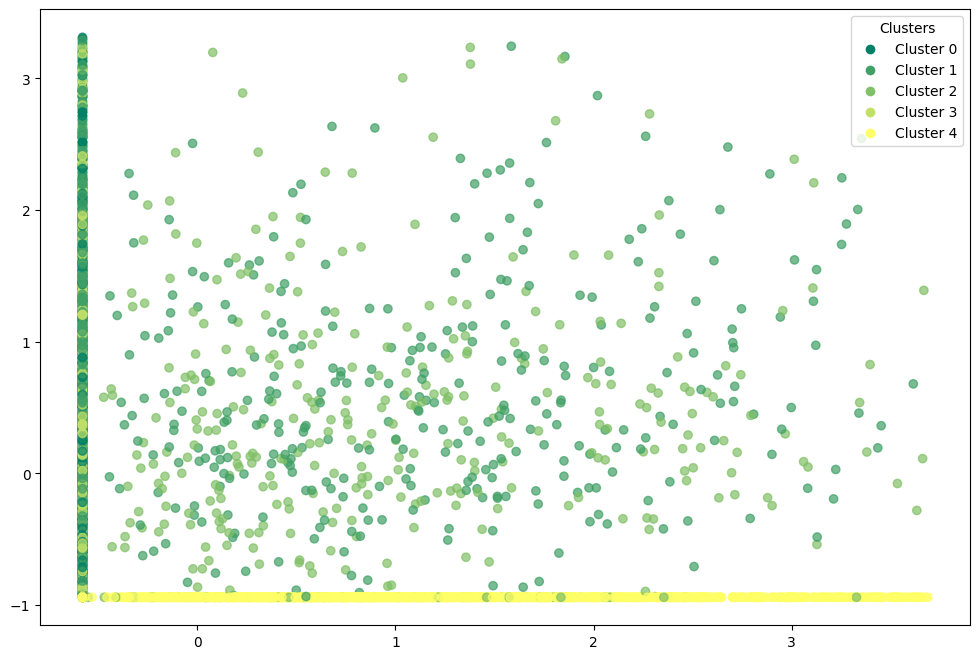

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['gmm'] = df_gmm['gmm']

In [ ]:
energy_scaled.groupby('gmm').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm,,,,,,,,,,
0,-0.579643,0.436628,0.985138,0.894851,1.186970,-0.422486,0.469151,0.422247,-0.037822,0.187890
1,-0.274733,0.648563,0.526429,-0.572128,-0.610013,-0.177456,0.065916,0.061246,0.452329,0.251008
2,0.976847,0.221895,-0.792347,0.534738,0.871159,-0.060183,0.080787,-0.159737,-0.376452,-0.113414
3,-0.579643,0.504371,0.414597,1.066256,0.869972,-0.182766,-0.349575,-0.462016,-0.784980,-0.560142
4,0.580127,-0.941585,-0.866919,-0.572128,-0.610013,0.400662,-0.064794,0.052501,0.150156,0.050592


In [ ]:
energy_scaled.drop('gmm',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])
ch = calinski_harabasz_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])
db = davies_bouldin_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.10808499706825513
Calinski-Harabasz: 755.9737802951871
Davies-Bouldin: 2.479876562899153


### GMM with pca

In [ ]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_pca.fit(X_pca)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_pca_gmm = X_pca.copy()

In [ ]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [ ]:
df_pca_gmm

,dim_1,dim_2,dim_3,gmm_pca
0,0.886679,1.363975,1.186636,3
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,4
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,3
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


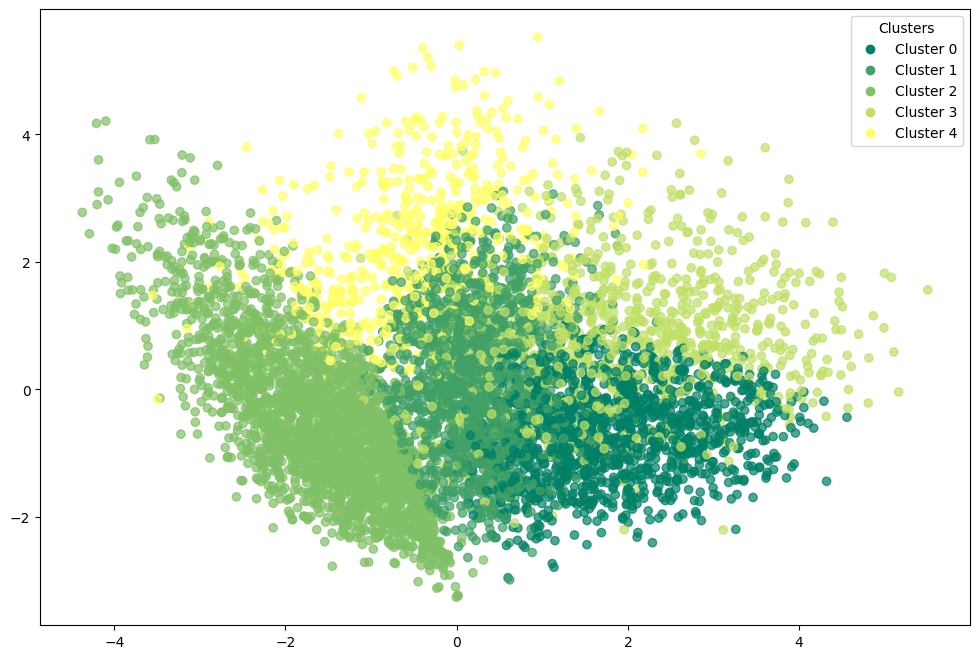

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['gmm_pca'] = df_pca_gmm['gmm_pca']

In [ ]:
energy_scaled.groupby('gmm_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_pca,,,,,,,,,,
0,-0.532104,0.447181,0.387762,0.977105,0.989290,-0.376205,-0.335625,-0.477374,-0.726849,-0.621607
1,-0.510325,0.601655,0.468317,-0.549138,-0.512501,-0.312712,-0.293899,-0.178246,0.207314,-0.102330
2,0.713615,-0.832760,-0.857860,-0.562982,-0.596246,0.449080,-0.043237,-0.029051,0.101384,-0.019141
3,-0.188675,0.503957,0.687602,1.433990,1.397929,-0.124568,0.583749,0.412003,-0.424895,0.277037
4,-0.388762,0.375736,0.668333,-0.483151,-0.400665,-0.167165,0.759086,0.977783,1.267211,1.264374


In [ ]:
energy_scaled.drop('gmm_pca',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])
ch = calinski_harabasz_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])
db = davies_bouldin_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.21547734895324422
Calinski-Harabasz: 2294.628148882067
Davies-Bouldin: 1.3964298199354706


### GMM with t-SNE

In [ ]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_tsne.fit(X_tsne)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_tsne_gmm = X_tsne.copy()

In [ ]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [ ]:
df_tsne_gmm

,dim_1,dim_2,dim_3,gmm_tsne
0,2.536473,-0.569887,9.241193,2
1,-4.466090,7.754672,-10.270030,4
2,-11.023314,11.286777,-2.401266,1
3,2.220190,8.093020,-1.315360,4
4,11.463785,9.571602,4.114413,2
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,1
7088,-8.877161,-0.713788,7.598481,1
7089,-6.021173,-15.945735,-2.919369,3
7090,-5.589542,-12.948777,-2.492481,3


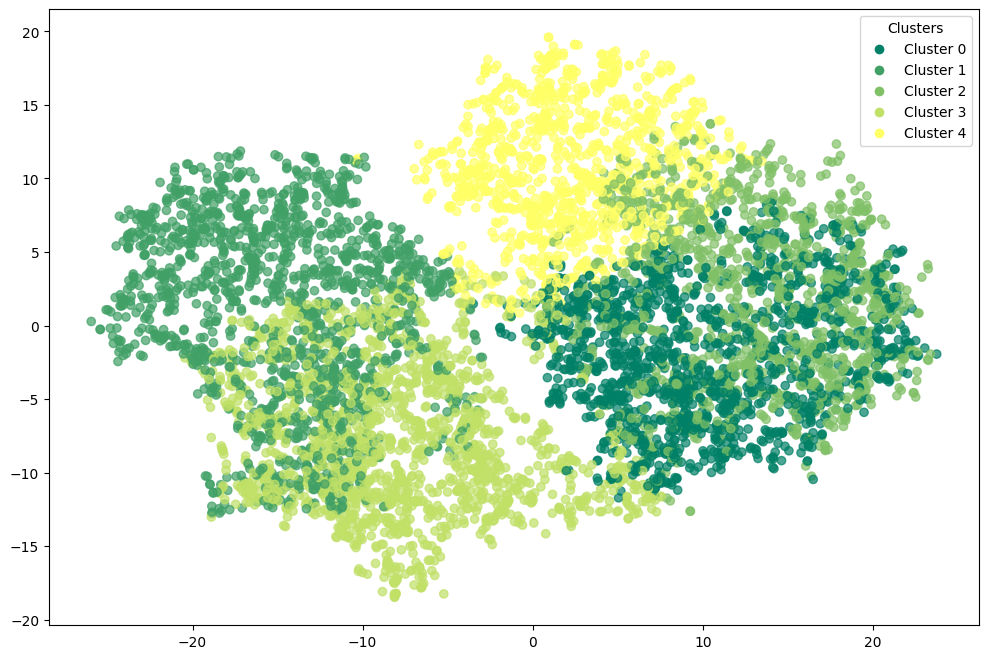

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['gmm_tsne'] = df_tsne_gmm['gmm_tsne']

In [ ]:
energy_scaled.groupby('gmm_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_tsne,,,,,,,,,,
0,-0.564223,0.606007,0.429212,-0.013250,0.137413,-0.355525,-0.410684,-0.449566,-0.353823,-0.556624
1,1.272791,-0.839047,-0.825221,-0.550094,-0.580838,1.093474,0.284761,0.269097,0.373460,0.282409
2,-0.472368,0.405962,0.687655,1.681262,1.614326,-0.260373,0.213437,0.056372,-0.583301,-0.028459
3,0.056008,-0.539991,-0.825961,-0.403357,-0.469674,-0.369841,-0.344067,-0.226182,-0.129635,-0.211406
4,-0.570983,0.706823,1.038412,-0.523647,-0.509734,-0.203290,0.434849,0.512599,0.822027,0.715684


In [ ]:
energy_scaled.drop('gmm_tsne',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])
ch = calinski_harabasz_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])
db = davies_bouldin_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.29680004715919495
Calinski-Harabasz: 3695.19326331188
Davies-Bouldin: 1.226599517571129


### GMM with umap

In [ ]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_umap.fit(X_umap)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_umap_gmm = X_umap.copy()

In [ ]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [ ]:
df_umap_gmm

,dim_1,dim_2,dim_3,gmm_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,3
2,8.055438,8.882436,5.173176,3
3,7.841428,6.987625,5.274173,3
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,4
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


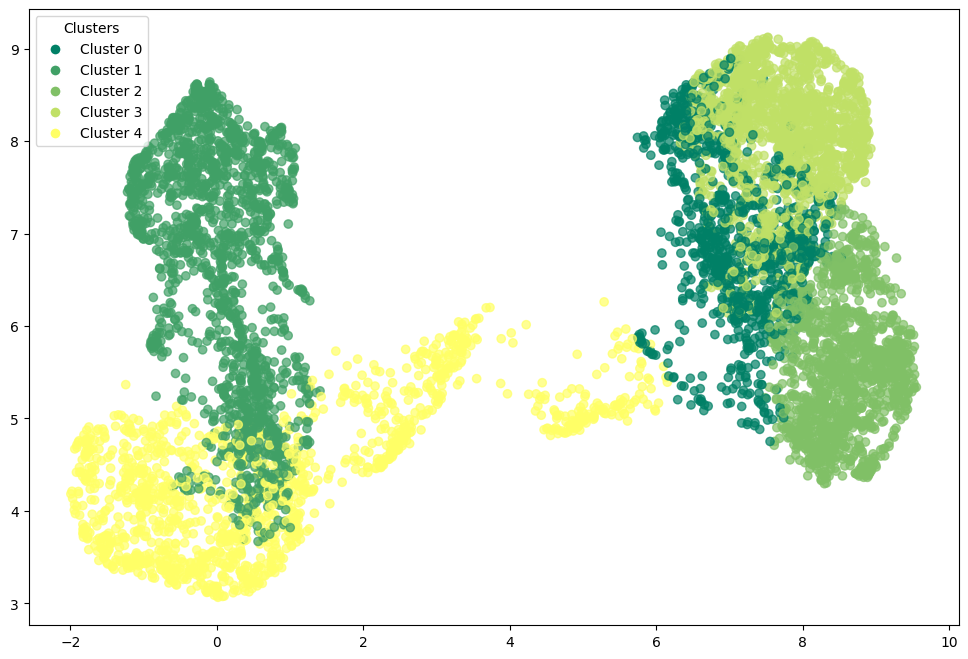

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['gmm_umap'] = df_umap_gmm['gmm_umap']

In [ ]:
energy_scaled.groupby('gmm_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_umap,,,,,,,,,,
0,-0.526174,0.202065,0.183575,-0.010458,0.461626,-0.337037,-0.175068,-0.600871,-0.448302,-0.739138
1,0.301871,-0.923073,-0.858833,-0.559883,-0.592866,-0.309966,-0.359269,-0.043814,0.036253,-0.098216
2,-0.556847,0.616448,0.841690,1.696679,1.386579,-0.257591,0.058595,0.078011,-0.630715,-0.052278
3,-0.569743,0.747609,0.875221,-0.533949,-0.521572,-0.183554,0.163590,0.266326,0.587380,0.421551
4,1.194370,-0.416698,-0.855255,-0.370544,-0.376166,1.110405,0.348238,0.117817,0.252274,0.244946


In [ ]:
energy_scaled.drop('gmm_umap',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])
ch = calinski_harabasz_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])
db = davies_bouldin_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.32398533821105957
Calinski-Harabasz: 10653.758520793803
Davies-Bouldin: 1.25071003556469


## pam

In [ ]:
initial_medoids = np.random.choice(len(energy_scaled),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam = kmedoids(energy_scaled.values.tolist(),initial_medoids,metric=metric)

In [ ]:
pam.process()

In [ ]:
clusters = pam.get_clusters()

In [ ]:
medoids = pam.get_medoids()

In [ ]:
labels = np.zeros(len(energy_scaled))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam = energy_scaled.copy()

In [ ]:
df_pam['pam'] = labels

In [ ]:
df_pam

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,pam
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3.0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,2.0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,2.0
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,2.0
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,3.0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,0.0
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,0.0
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1.0
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1.0


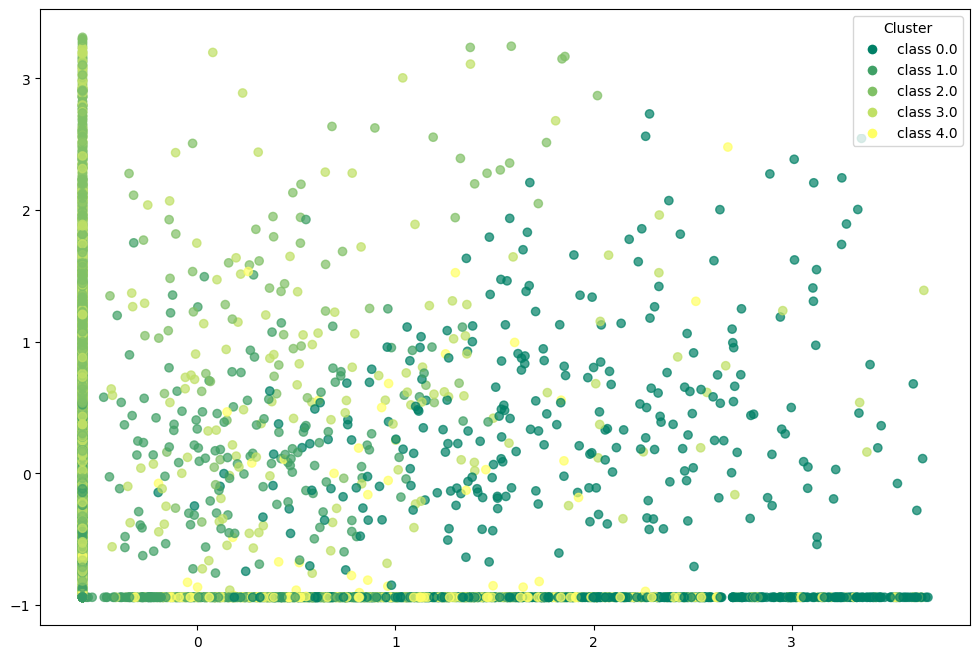

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
energy_scaled['pam'] = df_pam['pam']

In [ ]:
energy_scaled.groupby('pam').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam,,,,,,,,,,
0.0,1.551750,-0.608773,-0.865122,-0.484945,-0.495118,-0.173459,0.279822,0.519665,0.492094,0.486348
1.0,-0.306968,-0.618995,-0.668375,-0.477322,-0.481635,-0.403065,-0.543807,-0.535270,-0.398626,-0.602410
2.0,-0.541361,0.704535,0.810243,-0.398446,-0.325235,-0.239458,0.167837,0.236450,0.560275,0.379013
3.0,-0.461157,0.539399,0.590906,1.533424,1.461052,-0.298929,-0.029093,-0.147652,-0.713858,-0.297978
4.0,0.779125,-0.854438,-0.780831,-0.514926,-0.531640,2.232708,0.300733,0.022035,0.122988,0.140669


In [ ]:
energy_scaled.drop('pam',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_pam.iloc[:,:-1], df_pam['pam'])
ch = calinski_harabasz_score(df_pam.iloc[:,:-1], df_pam['pam'])
db = davies_bouldin_score(df_pam.iloc[:,:-1], df_pam['pam'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.16242000279926416
Calinski-Harabasz: 1299.2562171233844
Davies-Bouldin: 1.6855523535535515


### pam with pca

In [ ]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_pca = kmedoids(X_pca.values.tolist(),initial_medoids,metric=metric)

In [ ]:
pam_pca.process()

In [ ]:
clusters = pam_pca.get_clusters()

In [ ]:
medoids = pam_pca.get_medoids()

In [ ]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_pca = X_pca.copy()

In [ ]:
df_pam_pca['pam_pca'] = labels

In [ ]:
df_pam_pca

,dim_1,dim_2,dim_3,pam_pca
0,0.886679,1.363975,1.186636,0.0
1,-0.110236,-0.167015,-0.663318,4.0
2,-0.966315,2.136664,0.196361,1.0
3,0.073670,0.551620,-0.449555,4.0
4,1.649792,1.775372,1.256657,0.0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,3.0
7088,-1.573662,0.599975,0.321832,3.0
7089,-0.416653,-2.763515,-0.690737,2.0
7090,-0.618345,-2.158439,-0.582987,2.0


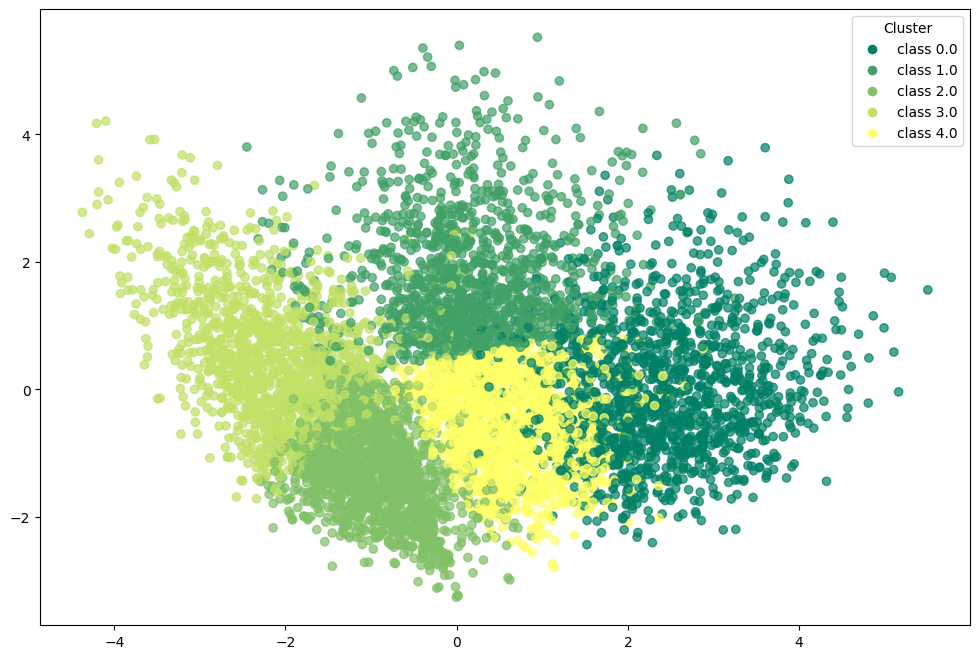

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
energy_scaled['pam_pca'] = df_pam_pca['pam_pca']

In [ ]:
energy_scaled.groupby('pam_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_pca,,,,,,,,,,
0.0,-0.441805,0.559000,0.641455,1.688979,1.595549,-0.277985,0.049673,-0.064982,-0.719427,-0.249984
1.0,-0.541877,0.723956,1.018808,-0.385017,-0.309918,-0.208970,0.405355,0.644736,0.944763,0.891860
2.0,0.104787,-0.772149,-0.835782,-0.533576,-0.555319,-0.048524,-0.502462,-0.467647,-0.272842,-0.497469
3.0,1.359406,-0.744847,-0.840908,-0.504323,-0.519925,0.905702,0.567646,0.568285,0.527215,0.607429
4.0,-0.532485,0.468953,0.297359,-0.224348,-0.154118,-0.360587,-0.347869,-0.486038,-0.286236,-0.518396


In [ ]:
energy_scaled.drop('pam_pca',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])
ch = calinski_harabasz_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])
db = davies_bouldin_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3007999349439528
Calinski-Harabasz: 3934.7383465543458
Davies-Bouldin: 1.0192808903391934


### pam with t-SNE

In [ ]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_tsne = kmedoids(X_tsne.values.tolist(),initial_medoids,metric=metric)

In [ ]:
pam_tsne.process()

In [ ]:
clusters = pam_tsne.get_clusters()

In [ ]:
medoids = pam_tsne.get_medoids()

In [ ]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_tsne = X_tsne.copy()

In [ ]:
df_pam_tsne['pam_tsne'] = labels

In [ ]:
df_pam_tsne

,dim_1,dim_2,dim_3,pam_tsne
0,2.536473,-0.569887,9.241193,4.0
1,-4.466090,7.754672,-10.270030,1.0
2,-11.023314,11.286777,-2.401266,3.0
3,2.220190,8.093020,-1.315360,1.0
4,11.463785,9.571602,4.114413,4.0
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,0.0
7088,-8.877161,-0.713788,7.598481,0.0
7089,-6.021173,-15.945735,-2.919369,2.0
7090,-5.589542,-12.948777,-2.492481,2.0


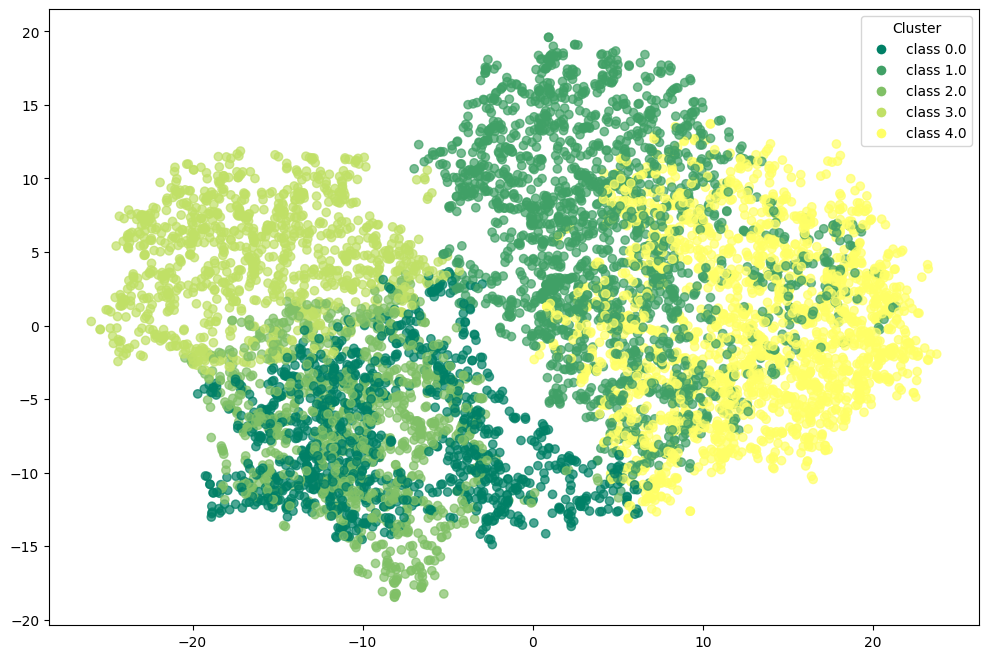

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
energy_scaled['pam_tsne'] = df_pam_tsne['pam_tsne']

In [ ]:
energy_scaled.groupby('pam_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_tsne,,,,,,,,,,
0.0,1.395984,-0.391739,-0.862613,-0.420812,-0.492334,-0.339525,-0.168933,0.082609,0.133909,0.025430
1.0,-0.568974,0.661752,0.767848,-0.507949,-0.363260,-0.264595,0.105744,0.114911,0.427777,0.193236
2.0,-0.518339,-0.919154,-0.844283,-0.557492,-0.590696,-0.381632,-0.550775,-0.080619,-0.031882,-0.130037
3.0,0.935760,-0.855852,-0.790701,-0.544467,-0.571947,1.854553,0.535748,0.071154,0.301323,0.227680
4.0,-0.474627,0.460629,0.557729,1.291264,1.220503,-0.313011,-0.015201,-0.157975,-0.636811,-0.258525


In [ ]:
energy_scaled.drop('pam_tsne',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])
ch = calinski_harabasz_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])
db = davies_bouldin_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3438965678215027
Calinski-Harabasz: 4239.703313670613
Davies-Bouldin: 1.0286886187855466


### pam with umap

In [ ]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_umap = kmedoids(X_umap.values.tolist(),initial_medoids,metric=metric)

In [ ]:
pam_umap.process()

In [ ]:
clusters = pam_umap.get_clusters()

In [ ]:
medoids = pam_umap.get_medoids()

In [ ]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_umap = X_umap.copy()

In [ ]:
df_pam_umap['pam_umap'] = labels

In [ ]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap
0,8.540884,5.635366,8.092696,0.0
1,6.674550,7.703112,4.661761,4.0
2,8.055438,8.882436,5.173176,4.0
3,7.841428,6.987625,5.274173,4.0
4,9.224665,5.318230,7.319454,0.0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,3.0
7088,0.870373,5.136365,5.973392,3.0
7089,-0.109102,8.384296,7.264081,2.0
7090,-0.318984,7.911990,6.649530,2.0


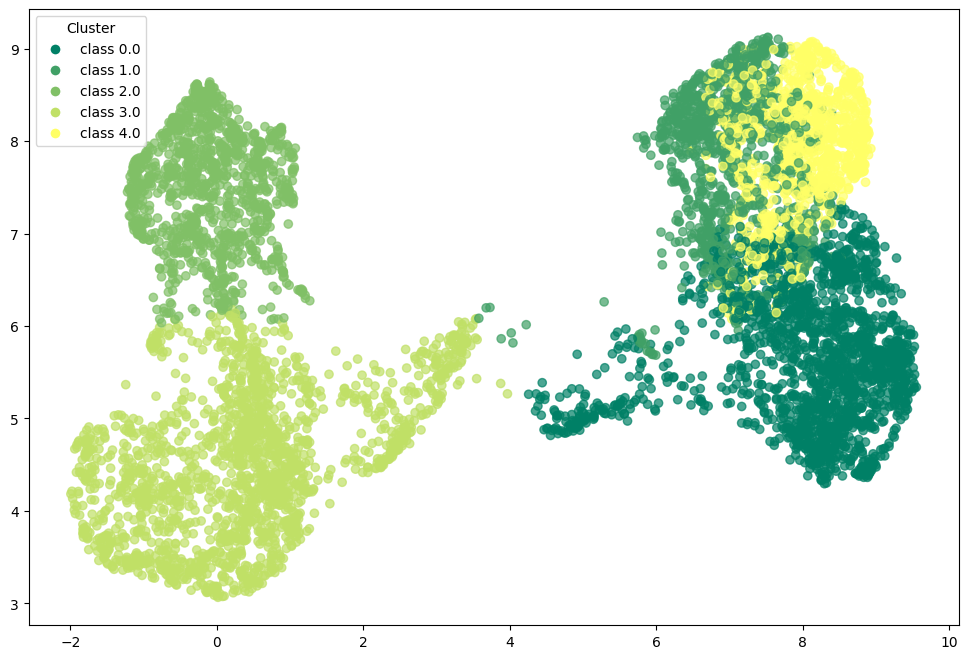

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
energy_scaled['pam_umap'] = df_pam_umap['pam_umap']

In [ ]:
energy_scaled.groupby('pam_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_umap,,,,,,,,,,
0.0,-0.384955,0.492091,0.566065,1.410678,1.313602,-0.292608,0.028451,-0.056934,-0.622254,-0.164633
1.0,-0.549483,0.485741,0.297730,-0.420972,-0.172873,-0.288080,-0.299352,-0.541799,-0.254991,-0.593199
2.0,-0.362617,-0.925252,-0.857373,-0.561307,-0.594295,-0.391762,-0.518357,-0.198517,-0.082432,-0.194255
3.0,1.266381,-0.655231,-0.856870,-0.544615,-0.576087,0.791168,0.230414,0.166525,0.321093,0.192326
4.0,-0.573137,0.733359,1.052089,-0.528469,-0.510983,-0.154382,0.373008,0.529748,0.846584,0.714033


In [ ]:
energy_scaled.drop('pam_umap',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])
ch = calinski_harabasz_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])
db = davies_bouldin_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.42137226462364197
Calinski-Harabasz: 15480.586784587895
Davies-Bouldin: 0.9144479247493849


## spectral clustering

In [ ]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [ ]:
spectral_clustering.fit(energy_scaled)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_spectral = energy_scaled.copy()

In [ ]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [ ]:
df_spectral

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,spectral_clustering
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,2
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,2
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,2
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,4
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,4
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,3
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,3


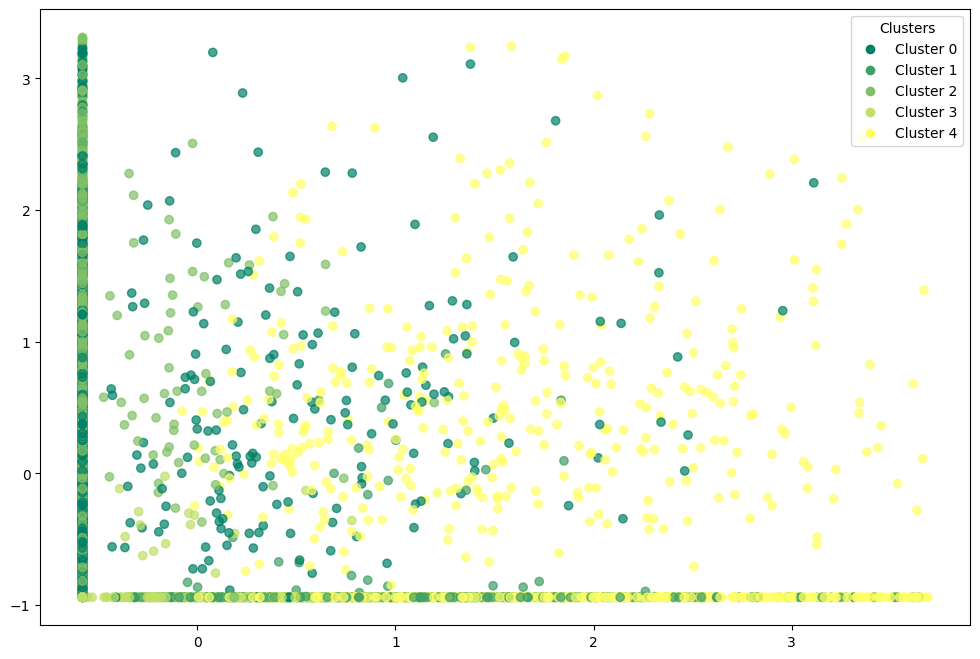

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['spectral_clustering'] = df_spectral['spectral_clustering']

In [ ]:
energy_scaled.groupby('spectral_clustering').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_clustering,,,,,,,,,,
0,-0.469911,0.468402,0.563746,1.298722,1.267736,-0.306179,-0.009712,-0.143617,-0.618435,-0.271509
1,0.814455,-0.887845,-0.812251,-0.543841,-0.565402,2.309644,0.266482,-0.014968,0.151051,0.059283
2,-0.561812,0.621486,0.686982,-0.506534,-0.421038,-0.244261,0.102321,0.104903,0.439586,0.249811
3,-0.424826,-0.926667,-0.855652,-0.558581,-0.592646,-0.383262,-0.620233,-0.348590,-0.258908,-0.374246
4,1.463021,-0.520644,-0.863806,-0.464066,-0.515008,-0.152119,0.160503,0.317526,0.353260,0.260716


In [ ]:
energy_scaled.drop('spectral_clustering',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])
ch = calinski_harabasz_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])
db = davies_bouldin_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.12199113832045057
Calinski-Harabasz: 1134.2170418847288
Davies-Bouldin: 1.7733871274066053


### spectral clustering with pca

In [ ]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [ ]:
spectral_pca.fit(X_pca)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_pca_spectral = X_pca.copy()

In [ ]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [ ]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca
0,0.886679,1.363975,1.186636,2
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,1
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,2
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,4
7088,-1.573662,0.599975,0.321832,0
7089,-0.416653,-2.763515,-0.690737,3
7090,-0.618345,-2.158439,-0.582987,3


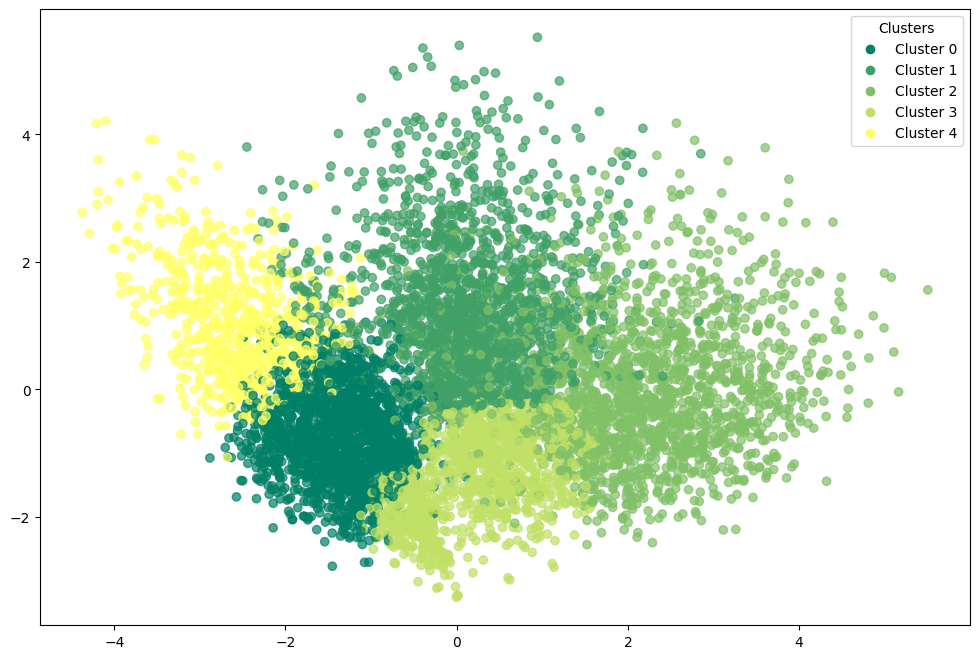

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                      c=df_pca_spectral['spectral_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_spectral['spectral_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['spectral_pca'] = df_pca_spectral['spectral_pca']

In [ ]:
energy_scaled.groupby('spectral_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_pca,,,,,,,,,,
0,0.542405,-0.766512,-0.842374,-0.545696,-0.573030,0.343379,-0.211008,-0.135133,-0.013055,-0.168162
1,-0.529737,0.668258,0.826939,-0.446538,-0.373284,-0.235226,0.205624,0.399362,0.764615,0.599881
2,-0.389929,0.520861,0.583820,1.481930,1.424227,-0.273187,0.083563,-0.049925,-0.674043,-0.223551
3,-0.436126,-0.132198,-0.313071,-0.393352,-0.357131,-0.410651,-0.614093,-0.769697,-0.557298,-0.810038
4,1.711480,-0.824585,-0.858879,-0.552405,-0.586974,1.145758,0.891368,0.847637,0.827191,0.939493


In [ ]:
energy_scaled.drop('spectral_pca',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])
ch = calinski_harabasz_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])
db = davies_bouldin_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.291423537322909
Calinski-Harabasz: 3654.868470099156
Davies-Bouldin: 0.9894626668344719


In [ ]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca
0,0.886679,1.363975,1.186636,2
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,1
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,2
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,4
7088,-1.573662,0.599975,0.321832,0
7089,-0.416653,-2.763515,-0.690737,3
7090,-0.618345,-2.158439,-0.582987,3


### spectral clustering with t-SNE

In [ ]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [ ]:
spectral_tsne.fit(X_tsne)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_tsne_spectral = X_tsne.copy()

In [ ]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [ ]:
df_tsne_spectral

,dim_1,dim_2,dim_3,spectral_tsne
0,2.536473,-0.569887,9.241193,0
1,-4.466090,7.754672,-10.270030,1
2,-11.023314,11.286777,-2.401266,4
3,2.220190,8.093020,-1.315360,1
4,11.463785,9.571602,4.114413,0
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,3
7088,-8.877161,-0.713788,7.598481,4
7089,-6.021173,-15.945735,-2.919369,2
7090,-5.589542,-12.948777,-2.492481,3


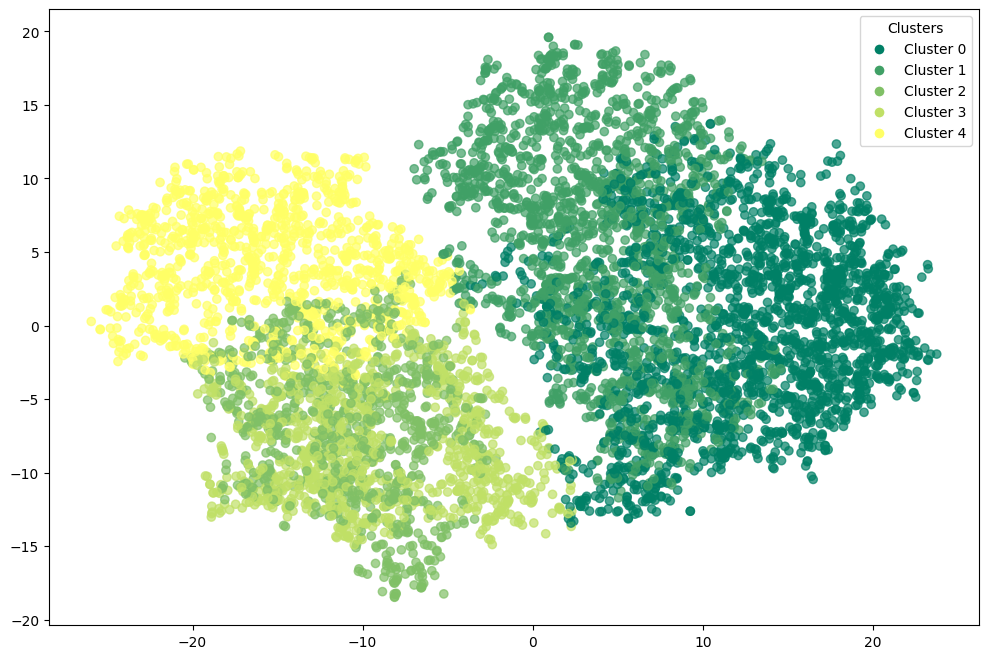

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['spectral_tsne'] = df_tsne_spectral['spectral_tsne']

In [ ]:
energy_scaled.groupby('spectral_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_tsne,,,,,,,,,,
0,-0.404312,0.461104,0.534347,1.156904,1.172710,-0.317949,0.033516,-0.120456,-0.544277,-0.229163
1,-0.569379,0.672397,0.755056,-0.529209,-0.499440,-0.247072,0.068466,0.110501,0.419658,0.240258
2,-0.529414,-0.926054,-0.853528,-0.561602,-0.593618,-0.399993,-0.588605,-0.049505,-0.001880,-0.105115
3,1.323698,-0.435148,-0.856174,-0.541837,-0.568036,-0.327623,-0.307946,-0.049180,0.165012,-0.062681
4,0.916128,-0.857999,-0.806102,-0.546030,-0.575476,1.649886,0.574278,0.151949,0.280295,0.221742


In [ ]:
energy_scaled.drop('spectral_tsne',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])
ch = calinski_harabasz_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])
db = davies_bouldin_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.327891081571579
Calinski-Harabasz: 3952.3366276172555
Davies-Bouldin: 1.063275729565728


### spectral clustering with umap

In [ ]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [ ]:
spectral_umap.fit(X_umap)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_umap_spectral = X_umap.copy()

In [ ]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [ ]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap
0,8.540884,5.635366,8.092696,0
1,6.674550,7.703112,4.661761,1
2,8.055438,8.882436,5.173176,1
3,7.841428,6.987625,5.274173,1
4,9.224665,5.318230,7.319454,0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,2
7088,0.870373,5.136365,5.973392,2
7089,-0.109102,8.384296,7.264081,3
7090,-0.318984,7.911990,6.649530,3


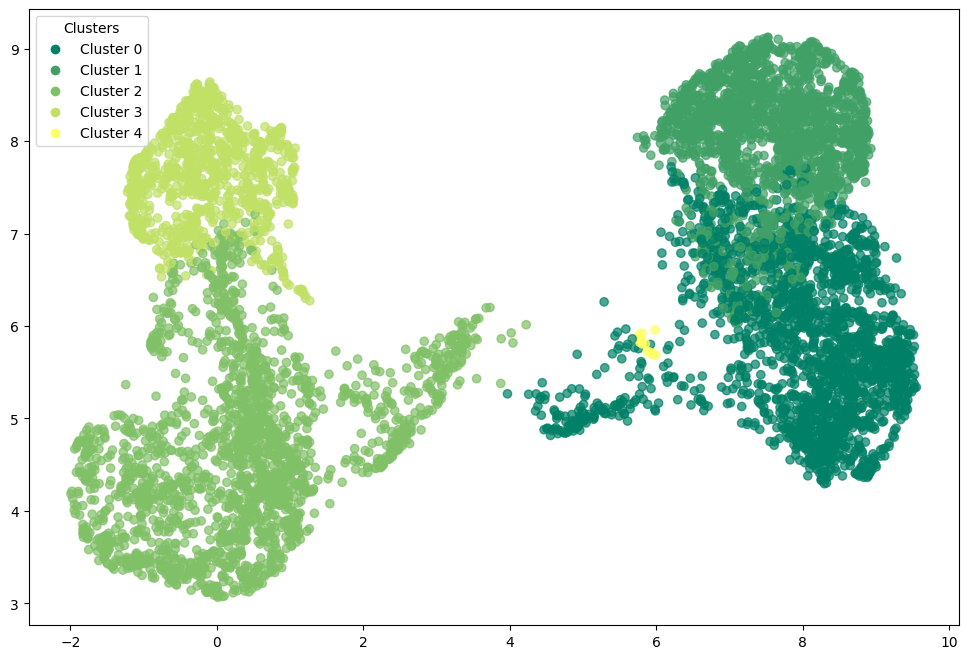

In [ ]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
energy_scaled['spectral_umap'] = df_umap_spectral['spectral_umap']

In [ ]:
energy_scaled.groupby('spectral_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_umap,,,,,,,,,,
0,-0.401743,0.473996,0.540886,1.229907,1.226471,-0.302304,0.000356,-0.100157,-0.571113,-0.222126
1,-0.568039,0.662014,0.741246,-0.526272,-0.474456,-0.228194,0.084832,0.075166,0.394809,0.191650
2,1.213032,-0.673201,-0.857648,-0.543721,-0.575590,0.700545,0.168088,0.088066,0.261106,0.122668
3,-0.510506,-0.926111,-0.855906,-0.563654,-0.596005,-0.394437,-0.509961,-0.101877,-0.028214,-0.118117
4,-0.579643,-0.278658,0.222358,-0.497836,-0.213569,2.712211,-0.055883,-0.197562,-0.645995,-0.735641


In [ ]:
energy_scaled.drop('spectral_umap',axis=1,inplace=True)

In [ ]:
sil = silhouette_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])
ch = calinski_harabasz_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])
db = davies_bouldin_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3745885193347931
Calinski-Harabasz: 12902.716638125496
Davies-Bouldin: 0.7805478552204975


# internal measures

Internal validation metrics evaluate clustering **without requiring ground truth labels**, based on cohesion (how close points are within a cluster) and separation (how far clusters are from each other).

---

## Silhouette Score

The **Silhouette Score** measures how similar a point is to its own cluster compared to other clusters.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to points in **other clusters** (nearest cluster separation).  
3. Silhouette score `s(i)`:
   \[
   s(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}
   \]
4. Overall score = average `s(i)` across all points.

**Interpretation:**
- `s ≈ 1` → point is well-clustered  
- `s ≈ 0` → point near cluster boundary  
- `s < 0` → point may be misclassified

**Strengths**
- Works without ground truth  
- Measures both cohesion and separation  
- Useful for estimating the optimal number of clusters  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to distance metric choice  

---

## Davies–Bouldin Index (DBI)

The **Davies–Bouldin Index** evaluates clustering based on **average similarity between clusters**. It quantifies the ratio of intra-cluster distance to inter-cluster separation.

1. For each cluster `i`, compute **average intra-cluster distance** `S_i`.  
2. For each pair of clusters `(i, j)`, compute **inter-cluster distance** `M_ij` between centroids.  
3. Compute the ratio `R_ij = (S_i + S_j) / M_ij`.  
4. For each cluster `i`, take `R_i = max_j R_ij`.  
5. DBI = average of all `R_i`.

**Interpretation:**
- **Lower DBI** → better clustering (clusters are compact and well-separated)  
- **Higher DBI** → clusters are overlapping or poorly separated

**Strengths**
- Does not require ground truth  
- Considers both cluster compactness and separation  

**Weaknesses**
- Sensitive to cluster shape and scale  
- Can favor algorithms that produce more clusters  

---

## Calinski–Harabasz Index (Variance Ratio Criterion)

The **Calinski–Harabasz Index (CH Index)** evaluates clustering using the **ratio of between-cluster dispersion to within-cluster dispersion**.

1. Compute **between-cluster dispersion** `B_k` (sum of squared distances between cluster centroids and overall mean).  
2. Compute **within-cluster dispersion** `W_k` (sum of squared distances of points to their cluster centroids).  
3. Compute the index:
\[
CH = \frac{B_k / (k-1)}{W_k / (n-k)}
\]
where `k` = number of clusters, `n` = number of points.

**Interpretation:**
- **Higher CH** → better clustering (dense and well-separated clusters)  
- Can be used to select the optimal number of clusters

**Strengths**
- Simple and fast to compute  
- Works without ground truth  
- Effective for convex, well-separated clusters  

**Weaknesses**
- Assumes clusters are roughly spherical  
- Sensitive to noise and outliers  

---

## Summary Table

| Metric | Ground Truth Required | Range | Meaning |
|--------|---------------------|-------|---------|
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-clustered, 0 = boundary, <0 = misclassified |
| **Davies–Bouldin Index** | ❌ | [0, ∞) | Lower is better (compact & separated clusters) |
| **Calinski–Harabasz Index** | ❌ | [0, ∞) | Higher is better (dense & well-separated clusters) |

In [ ]:
results = {}

def evaluate_clustering(X, y_pred):

    scores = {
        "Silhouette": silhouette_score(X, y_pred),
        "Davies Bouldin": davies_bouldin_score(X, y_pred),
        "Calinski Harabasz": calinski_harabasz_score(X, y_pred),
        
    }
    return scores

def evaluate_and_store(name, X, y_pred):
    scores = evaluate_clustering(X, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",df_kmeans.drop(['k_means'],axis=1).values,df_kmeans['k_means'])

evaluate_and_store("k-means + pca",df_pca_kmeans.drop(['kmeans_pca'],axis=1).values,df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",df_tsne_kmeans.drop(['kmeans_tsne'],axis=1).values,df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",df_umap_kmeans.drop(['kmeans_umap'],axis=1).values,df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",df_birch.drop(['birch'],axis=1).values,df_birch['birch'])

evaluate_and_store("Birch + pca",df_pca_birch.drop(['birch_pca'],axis=1).values,df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",df_tsne_birch.drop(['birch_tsne'],axis=1).values,df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",df_umap_birch.drop(['birch_umap'],axis=1).values,df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",df_gmm.drop(['gmm'],axis=1).values,df_gmm['gmm'])

evaluate_and_store("GMM + pca",df_pca_gmm.drop(['gmm_pca'],axis=1).values,df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",df_tsne_gmm.drop(['gmm_tsne'],axis=1).values,df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",df_umap_gmm.drop(['gmm_umap'],axis=1).values,df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",df_pam.drop(['pam'],axis=1).values,df_pam['pam'])

evaluate_and_store("PAM + pca",df_pam_pca.drop(['pam_pca'],axis=1).values,df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",df_pam_tsne.drop(['pam_tsne'],axis=1).values,df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",df_pam_umap.drop(['pam_umap'],axis=1).values,df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",df_spectral.drop(['spectral_clustering'],axis=1).values,df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",df_pca_spectral.drop(['spectral_pca'],axis=1).values,df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",df_tsne_spectral.drop(['spectral_tsne'],axis=1).values,df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",df_umap_spectral.drop(['spectral_umap'],axis=1).values,df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                            Silhouette  Davies Bouldin  Calinski Harabasz
k-means                          0.189           1.650           1357.102
k-means + pca                    0.308           1.025           3975.130
k-means + tsne                   0.327           1.137           4211.234
k-means + umap                   0.412           0.865          12050.719
Birch                            0.101           2.167            743.619
Birch + pca                      0.254           1.070           2344.278
Birch + tsne                     0.271           1.249           3383.489
Birch + umap                     0.473           0.778          14918.548
GMM                              0.108           2.480            755.974
GMM + pca                        0.215           1.396           2294.628
GMM + tsne                       0.297           1.227           3695.193
GMM + umap                       0.324           1.251          10653.759
PAM                              0.162

In [ ]:
df_results

,Silhouette,Davies Bouldin,Calinski Harabasz
k-means,0.189,1.650,1357.102
k-means + pca,0.308,1.025,3975.130
k-means + tsne,0.327,1.137,4211.234
k-means + umap,0.412,0.865,12050.719
Birch,0.101,2.167,743.619
Birch + pca,0.254,1.070,2344.278
Birch + tsne,0.271,1.249,3383.489
Birch + umap,0.473,0.778,14918.548
GMM,0.108,2.480,755.974
GMM + pca,0.215,1.396,2294.628


In [ ]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,3
2,8.055438,8.882436,5.173176,3
3,7.841428,6.987625,5.274173,3
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


In [ ]:
df_umap_kmeans['state'] = energy_complete['state_postal']

In [ ]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,state
0,8.540884,5.635366,8.092696,2,NM
1,6.674550,7.703112,4.661761,3,NaN
2,8.055438,8.882436,5.173176,3,NaN
3,7.841428,6.987625,5.274173,3,SC
4,9.224665,5.318230,7.319454,2,NaN
...,...,...,...,...,...
7087,0.898640,4.104914,6.800636,1,NV
7088,0.870373,5.136365,5.973392,1,MT
7089,-0.109102,8.384296,7.264081,1,NaN
7090,-0.318984,7.911990,6.649530,1,FL


In [ ]:
df_umap_kmeans.isna().sum()

dim_1             0
dim_2             0
dim_3             0
kmeans_umap       0
state          2415
dtype: int64

In [ ]:
map = df_umap_kmeans.groupby('state')['kmeans_umap'].agg(lambda x: x.value_counts().idxmax()).reset_index(name='dominant_cluster')

In [ ]:
map

,state,dominant_cluster
0,AK,1
1,AL,1
2,AR,1
3,AZ,1
4,CA,1
5,CO,1
6,CT,1
7,DC,2
8,DE,1
9,FL,1


In [ ]:
import geopandas as gpd

url = "https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_20m.zip"
states = gpd.read_file(url)
merged = states.merge(map, left_on='STUSPS', right_on='state', how='left')

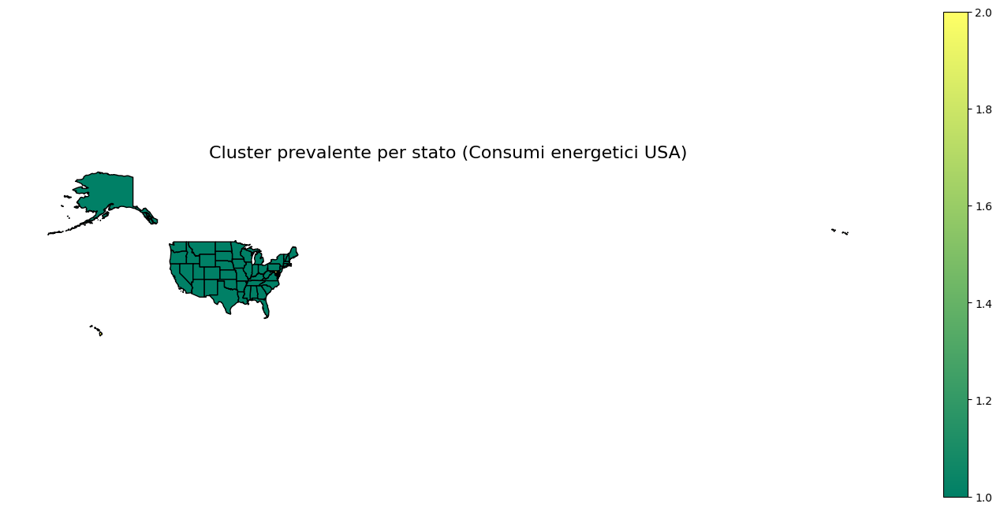

In [ ]:
fig, ax = plt.subplots(figsize=(18, 8))
merged.plot(
    column='dominant_cluster',
    cmap='summer',
    legend=True,
    ax=ax,
    edgecolor='black',
)
plt.title('Cluster prevalente per stato (Consumi energetici USA)', fontsize=16)
plt.axis('off')
plt.show()